<a href="https://colab.research.google.com/github/bhamees79-alt/SIH_PROJECT/blob/main/Person3_Video_Label_Analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import cv2
import os

videos = [
    "/content/C6.mp4",
    "/content/c1 (1).mp4"
]

for video_path in videos:
    cap = cv2.VideoCapture(video_path)

    fps = cap.get(cv2.CAP_PROP_FPS)
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    duration = total_frames / fps if fps else 0

    print("=" * 50)
    print("Video:", os.path.basename(video_path))
    print("FPS:", fps)
    print("Total frames:", total_frames)
    print("Duration:", round(duration, 2), "seconds")

    cap.release()

Video: C6.mp4
FPS: 30.00823602668438
Total frames: 385
Duration: 12.83 seconds
Video: c1 (1).mp4
FPS: 30.101786186100544
Total frames: 319
Duration: 10.6 seconds


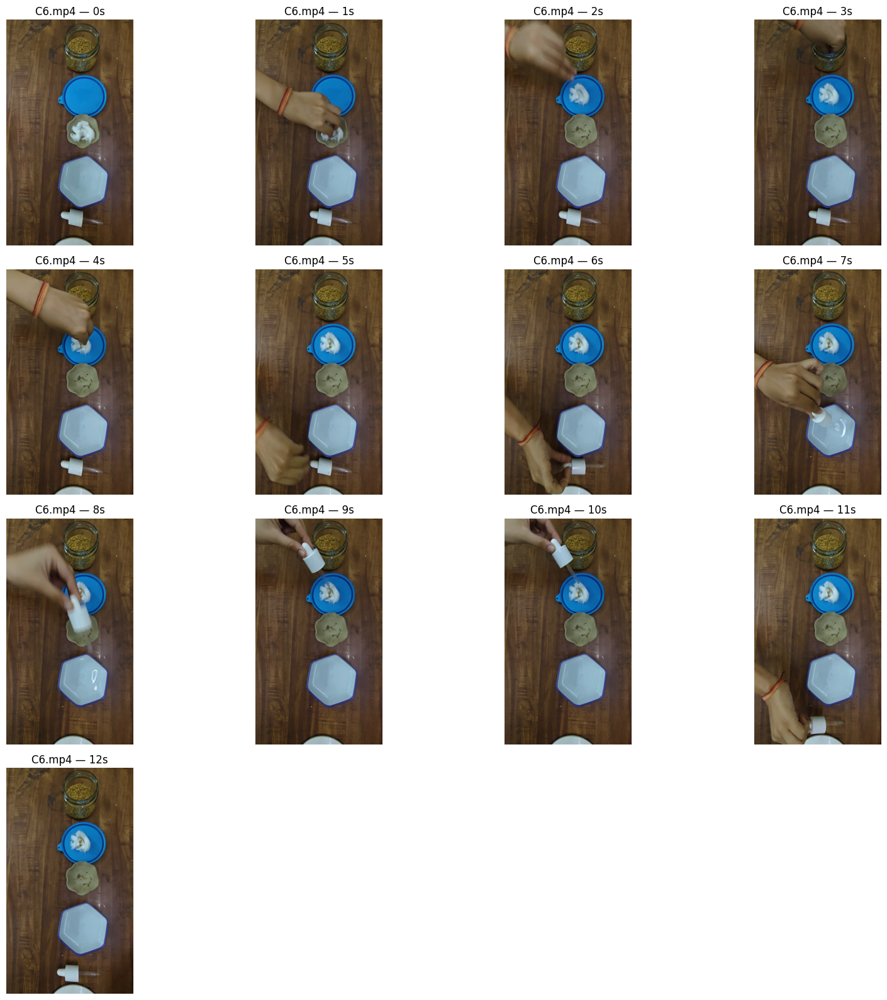

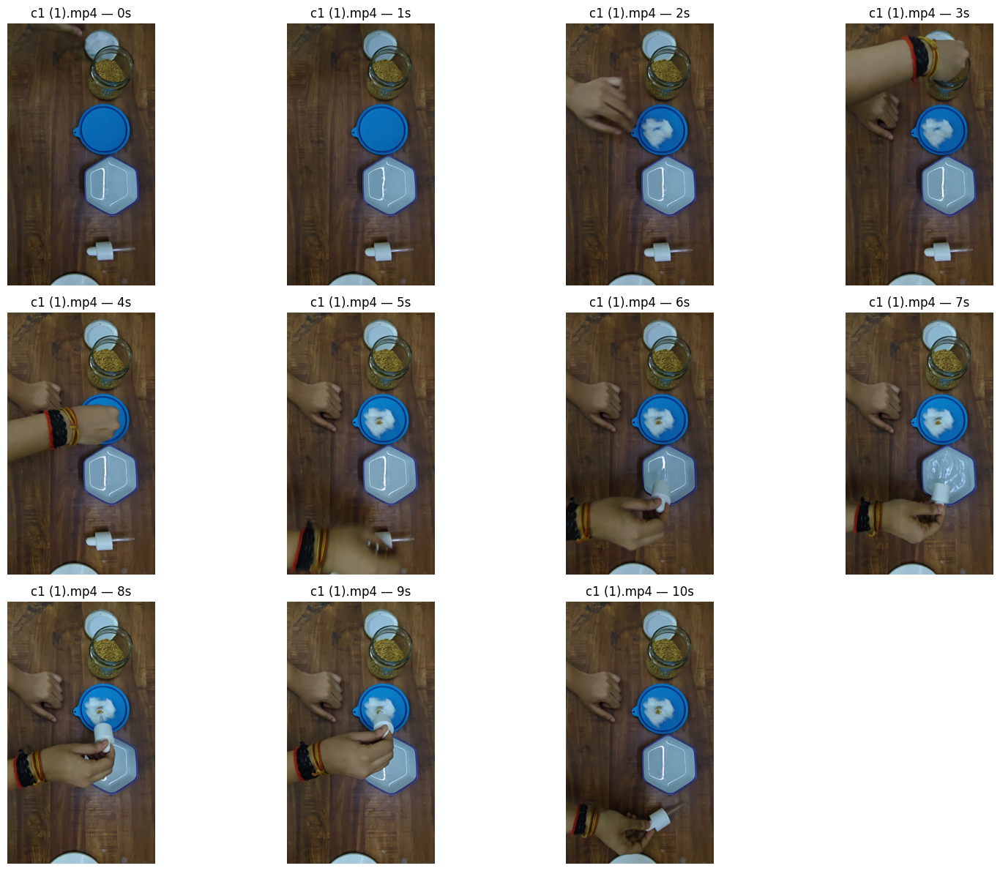

In [ ]:
import cv2
import matplotlib.pyplot as plt
import os

videos = [
    "/content/C6.mp4",
    "/content/c1 (1).mp4"
]

for video_path in videos:
    cap = cv2.VideoCapture(video_path)

    fps = cap.get(cv2.CAP_PROP_FPS)
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    duration = total_frames / fps

    times = [i for i in range(int(duration) + 1)]

    frames = []

    for t in times:
        cap.set(cv2.CAP_PROP_POS_MSEC, t * 1000)
        ret, frame = cap.read()

        if ret:
            frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
            frames.append((t, frame))

    cap.release()

    cols = 4
    rows = (len(frames) + cols - 1) // cols

    plt.figure(figsize=(16, 4 * rows))

    for i, (t, frame) in enumerate(frames):
        plt.subplot(rows, cols, i + 1)
        plt.imshow(frame)
        plt.title(f"{os.path.basename(video_path)} — {t}s")
        plt.axis("off")

    plt.tight_layout()
    plt.show()

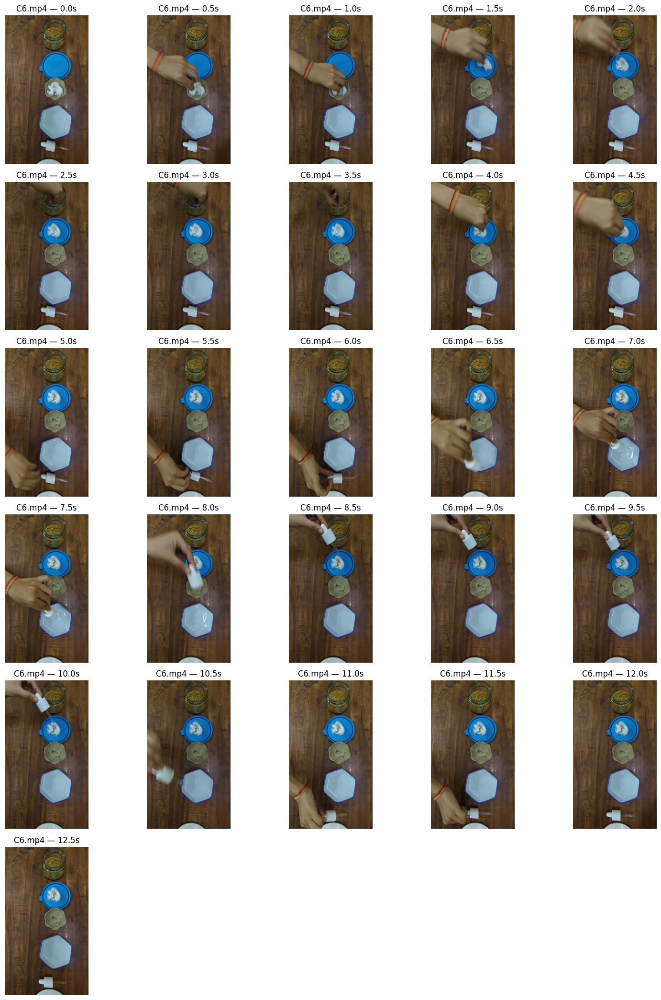

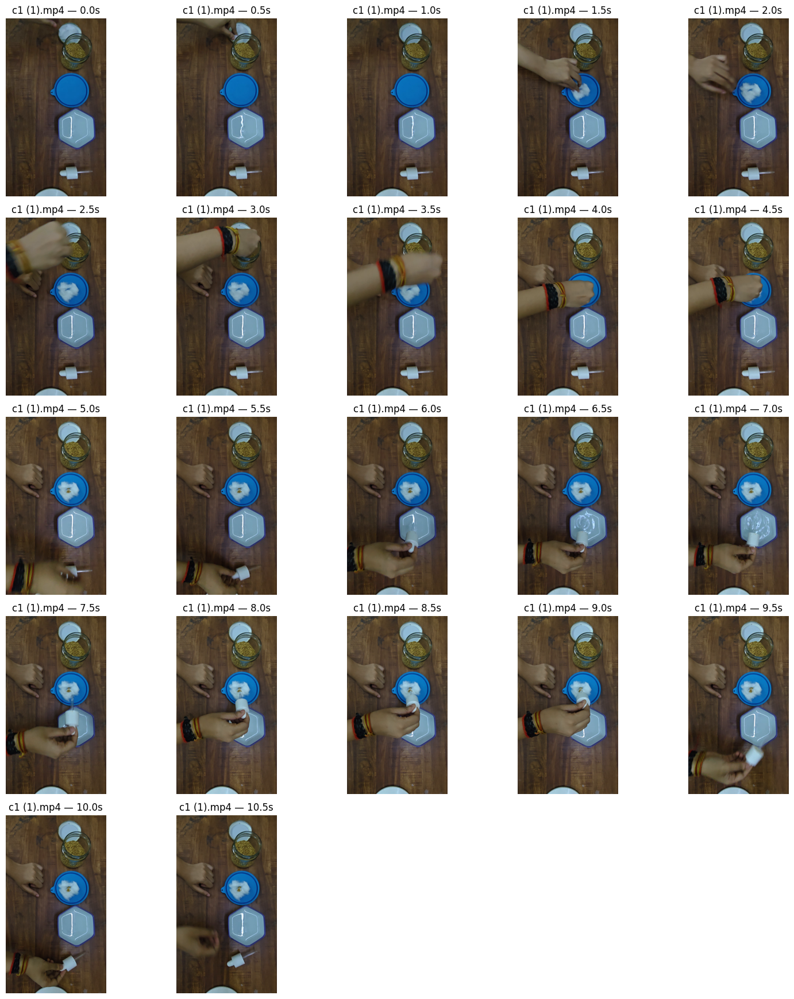

In [ ]:
import cv2
import matplotlib.pyplot as plt
import os

videos = [
    "/content/C6.mp4",
    "/content/c1 (1).mp4"
]

for video_path in videos:
    cap = cv2.VideoCapture(video_path)

    fps = cap.get(cv2.CAP_PROP_FPS)
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    duration = total_frames / fps

    times = [round(i * 0.5, 1) for i in range(int(duration * 2) + 1)]

    frames = []

    for t in times:
        cap.set(cv2.CAP_PROP_POS_MSEC, t * 1000)
        ret, frame = cap.read()

        if ret:
            frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
            frames.append((t, frame))

    cap.release()

    cols = 5
    rows = (len(frames) + cols - 1) // cols

    plt.figure(figsize=(15, 3.5 * rows))

    for i, (t, frame) in enumerate(frames):
        plt.subplot(rows, cols, i + 1)
        plt.imshow(frame)
        plt.title(f"{os.path.basename(video_path)} — {t}s")
        plt.axis("off")

    plt.tight_layout()
    plt.show()

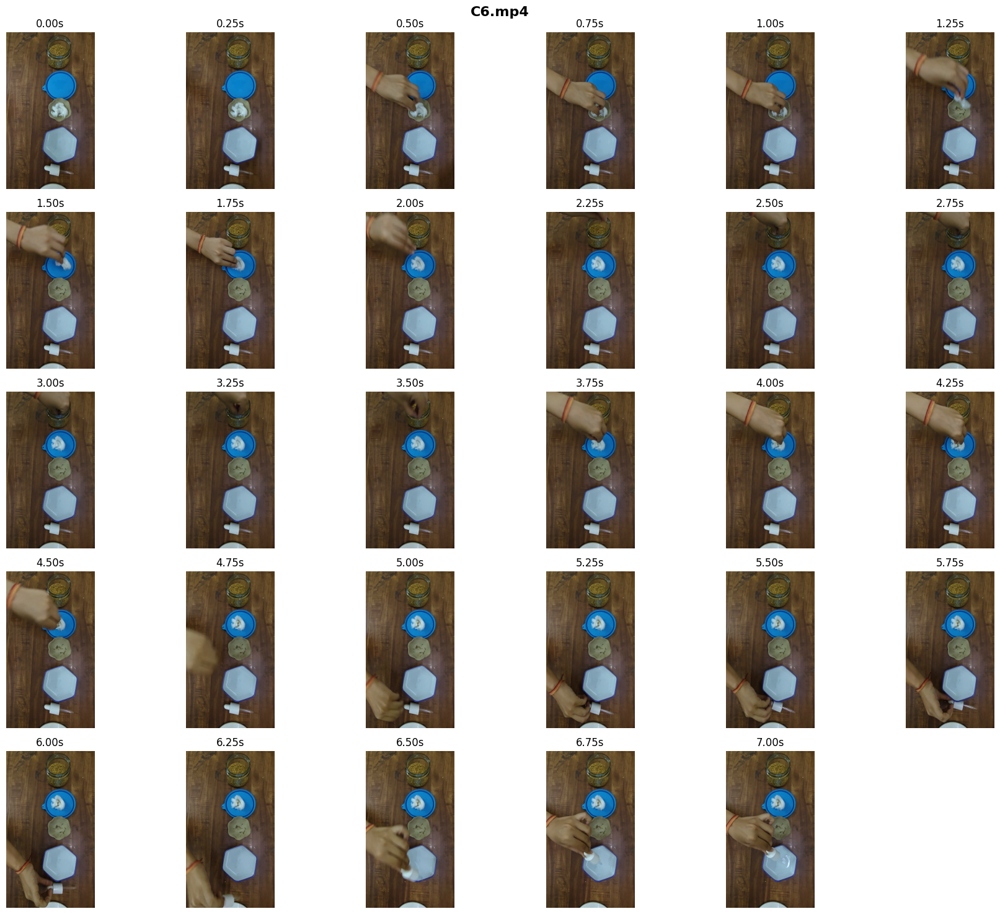

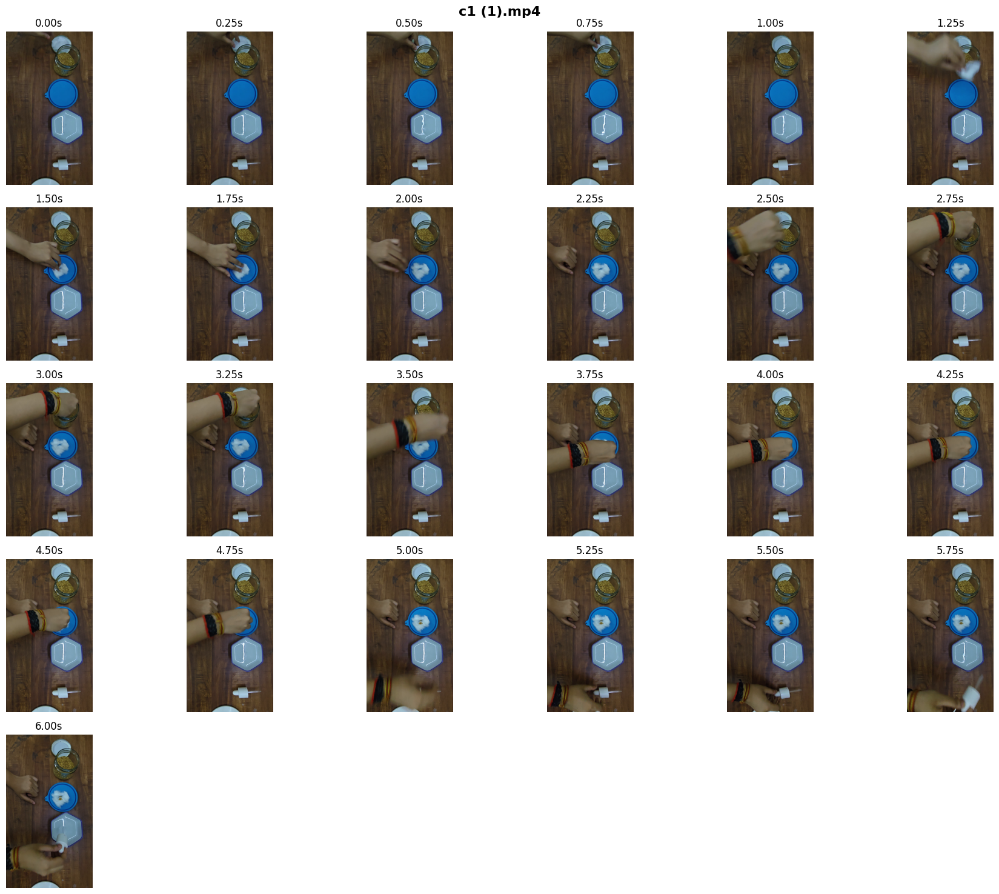

In [ ]:
import cv2
import matplotlib.pyplot as plt
import os

video_ranges = {
    "/content/C6.mp4": (0, 7),
    "/content/c1 (1).mp4": (0, 6)
}

for video_path, (start, end) in video_ranges.items():

    cap = cv2.VideoCapture(video_path)
    fps = cap.get(cv2.CAP_PROP_FPS)

    times = [round(start + i * 0.25, 2)
             for i in range(int((end - start) / 0.25) + 1)]

    frames = []

    for t in times:
        cap.set(cv2.CAP_PROP_POS_FRAMES, int(t * fps))
        ret, frame = cap.read()

        if ret:
            frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
            frames.append((t, frame))

    cap.release()

    cols = 6
    rows = (len(frames) + cols - 1) // cols

    plt.figure(figsize=(18, 3 * rows))

    for i, (t, frame) in enumerate(frames):
        plt.subplot(rows, cols, i + 1)
        plt.imshow(frame)
        plt.title(f"{t:.2f}s")
        plt.axis("off")

    plt.suptitle(
        os.path.basename(video_path),
        fontsize=16,
        fontweight="bold"
    )

    plt.tight_layout()
    plt.show()

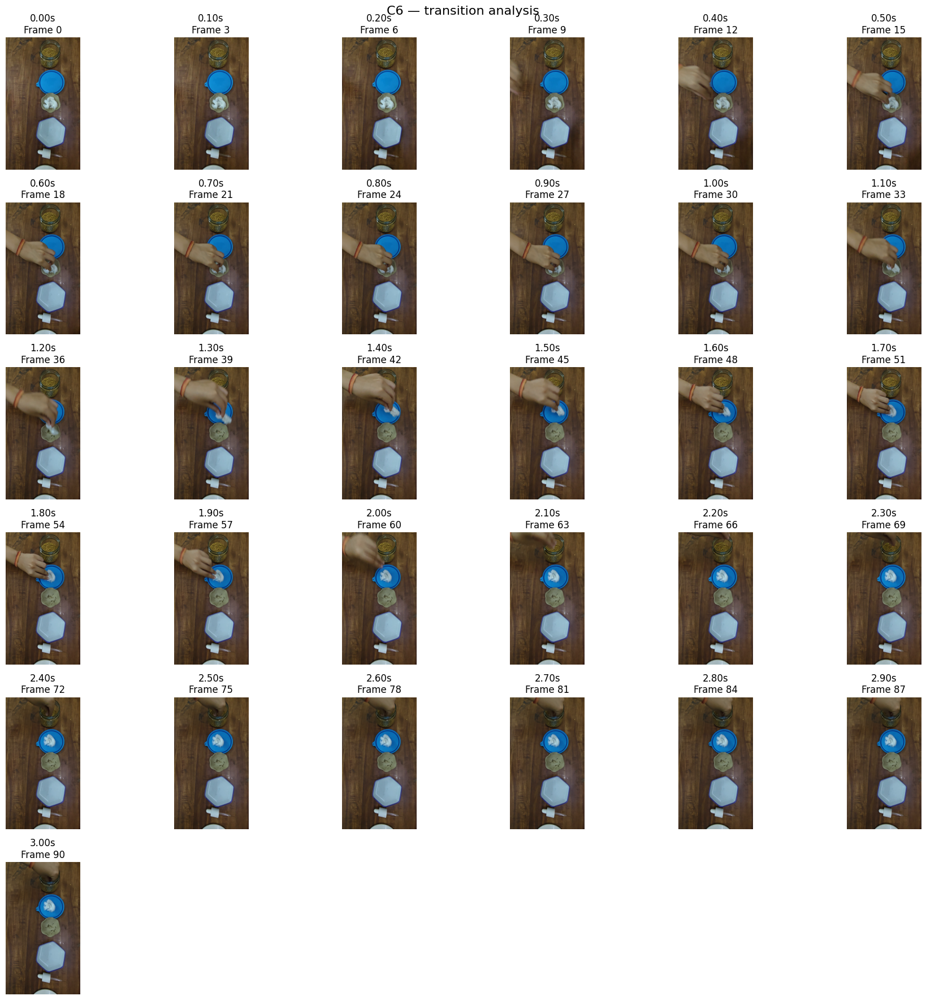

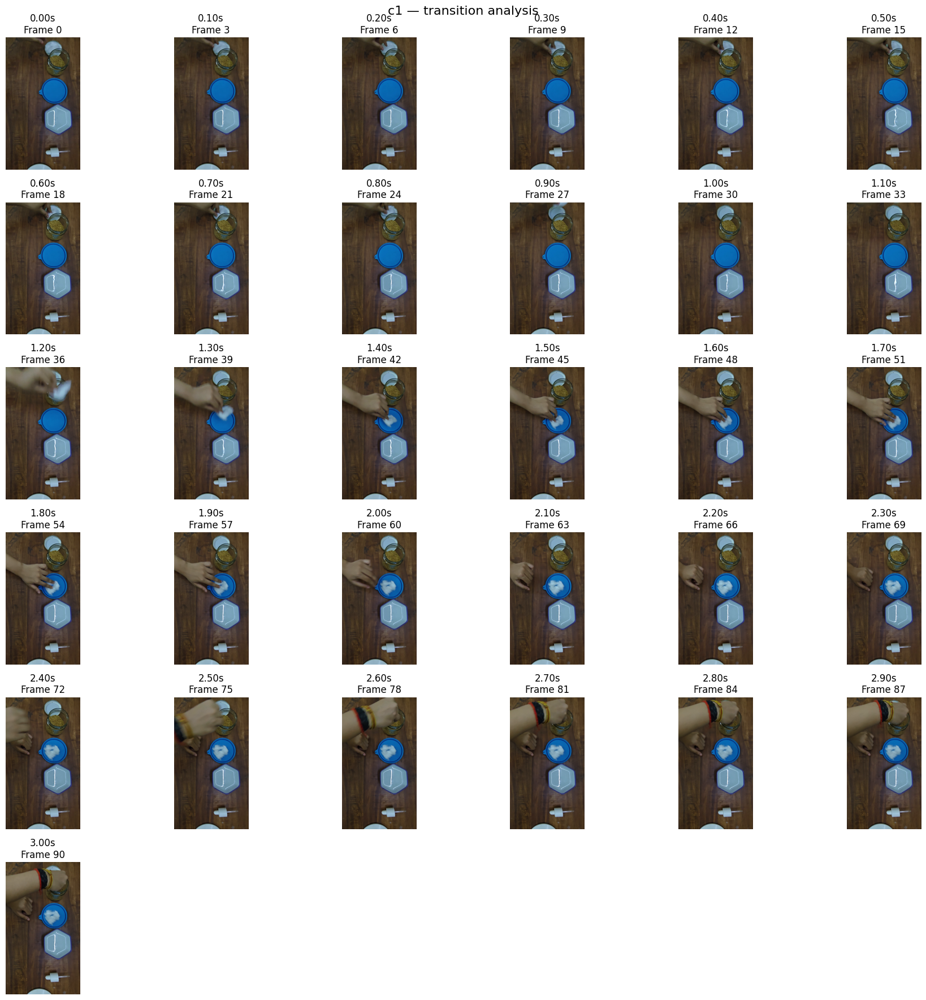

In [ ]:
import cv2
import matplotlib.pyplot as plt

videos = {
    "C6": "/content/C6.mp4",
    "c1": "/content/c1 (1).mp4"
}

# Focus on the first 3 seconds
for name, video_path in videos.items():

    cap = cv2.VideoCapture(video_path)
    fps = cap.get(cv2.CAP_PROP_FPS)

    times = [round(i * 0.10, 2) for i in range(31)]

    frames = []

    for t in times:
        cap.set(cv2.CAP_PROP_POS_FRAMES, int(t * fps))
        ret, frame = cap.read()

        if ret:
            frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
            frames.append((t, frame))

    cap.release()

    cols = 6
    rows = (len(frames) + cols - 1) // cols

    plt.figure(figsize=(18, 3 * rows))

    for i, (t, frame) in enumerate(frames):
        plt.subplot(rows, cols, i + 1)
        plt.imshow(frame)
        plt.title(f"{t:.2f}s\nFrame {int(t * fps)}")
        plt.axis("off")

    plt.suptitle(f"{name} — transition analysis", fontsize=16)
    plt.tight_layout()
    plt.show()

In [ ]:
# Check the exact labels and annotation information for C6.mp4 and c1 (1).mp4

import pandas as pd

# Load Person 1 temporal dataset metadata if available
files_to_check = [
    "C6.mp4",
    "c1 (1).mp4"
]

# Search through all CSV files in the project
import glob
csv_files = glob.glob("SIH_PROJECT/**/*.csv", recursive=True)

print("CSV files found:")
for f in csv_files:
    print(f)

print("\n" + "="*70)

for csv_file in csv_files:
    try:
        df = pd.read_csv(csv_file)

        # Search every column for the video names
        mask = pd.Series(False, index=df.index)

        for col in df.columns:
            mask |= df[col].astype(str).str.contains(
                "C6.mp4|c1 \\(1\\).mp4",
                case=False,
                regex=True,
                na=False
            )

        matches = df[mask]

        if len(matches) > 0:
            print(f"\nFILE: {csv_file}")
            print(matches.to_string(index=False))

    except Exception as e:
        print(f"Could not read {csv_file}: {e}")

CSV files found:



In [ ]:
import os

print("CSV files available in Colab:")
print("=" * 60)

found = []

for root, dirs, files in os.walk("/content"):
    for file in files:
        if file.lower().endswith(".csv"):
            path = os.path.join(root, file)
            found.append(path)

if found:
    for path in found:
        print(path)
else:
    print("❌ No CSV files found under /content")

CSV files available in Colab:
/content/sample_data/california_housing_test.csv
/content/sample_data/mnist_train_small.csv
/content/sample_data/california_housing_train.csv
/content/sample_data/mnist_test.csv


In [ ]:
import os

print("CSV files inside SIH_PROJECT:")
print("=" * 60)

for root, dirs, files in os.walk("/content/SIH_PROJECT"):
    for file in files:
        if file.endswith(".csv"):
            print(os.path.join(root, file))

CSV files inside SIH_PROJECT:


In [ ]:
import os

path = "/content/SIH_PROJECT/person2"

print("Does person2 folder exist?", os.path.exists(path))

if os.path.exists(path):
    print("\nFiles inside person2:")
    print("=" * 60)
    for file in os.listdir(path):
        print(file)

Does person2 folder exist? False


In [ ]:
!rm -rf /content/SIH_PROJECT
!git clone https://github.com/bhamees79-alt/SIH_PROJECT.git /content/SIH_PROJECT

Cloning into '/content/SIH_PROJECT'...
remote: Enumerating objects: 28, done.
remote: Counting objects: 100% (28/28), done.
remote: Compressing objects: 100% (23/23), done.
remote: Total 28 (delta 3), reused 20 (delta 3), pack-reused 0 (from 0)
Receiving objects: 100% (28/28), 1.97 MiB | 14.53 MiB/s, done.
Resolving deltas: 100% (3/3), done.


In [ ]:
import os

path = "/content/SIH_PROJECT/person2"

print("Does person2 folder exist?", os.path.exists(path))

if os.path.exists(path):
    print("\nFiles inside person2:")
    print("=" * 60)
    for file in os.listdir(path):
        print(file)

Does person2 folder exist? True

Files inside person2:
feature_names.txt
Person2_YOLO_Tracking_Pose_Feature_Pipeline.ipynb
train_sequence_metadata.csv
feature_scaler_padding_aware.pkl
y_train.npy
val_sequence_metadata.csv
y_test.npy
X_val_scaled_padding_aware.npy
X_train_scaled_padding_aware.npy
X_test_scaled_padding_aware.npy
y_val.npy
test_sequence_metadata.csv


In [ ]:
import pandas as pd

base = "/content/SIH_PROJECT/person2"

files = [
    "train_sequence_metadata.csv",
    "val_sequence_metadata.csv",
    "test_sequence_metadata.csv"
]

for file in files:
    path = f"{base}/{file}"
    df = pd.read_csv(path)

    print("\n" + "=" * 70)
    print(file)
    print("Rows:", len(df))
    print("Columns:", list(df.columns))

    # Search for C6 or c1 in every column
    mask = pd.Series(False, index=df.index)

    for col in df.columns:
        mask |= df[col].astype(str).str.contains(
            "C6|c1",
            case=False,
            regex=True,
            na=False
        )

    matches = df[mask]

    print("\nMatching rows:")
    if len(matches) > 0:
        print(matches.to_string(index=False))
    else:
        print("No matching videos found.")


train_sequence_metadata.csv
Rows: 1334
Columns: ['sequence_index', 'segment_uid', 'clip_id', 'video_id', 'activity', 'label', 'step_id', 'behavior', 'variation', 'original_length', 'padded_frames']

Matching rows:
No matching videos found.

val_sequence_metadata.csv
Rows: 313
Columns: ['sequence_index', 'segment_uid', 'clip_id', 'video_id', 'activity', 'label', 'step_id', 'behavior', 'variation', 'original_length', 'padded_frames']

Matching rows:
No matching videos found.

test_sequence_metadata.csv
Rows: 294
Columns: ['sequence_index', 'segment_uid', 'clip_id', 'video_id', 'activity', 'label', 'step_id', 'behavior', 'variation', 'original_length', 'padded_frames']

Matching rows:
No matching videos found.


In [ ]:
import pandas as pd

base = "/content/SIH_PROJECT/person2"

for file in [
    "train_sequence_metadata.csv",
    "val_sequence_metadata.csv",
    "test_sequence_metadata.csv"
]:
    df = pd.read_csv(f"{base}/{file}")

    print("\n" + "=" * 70)
    print(file)

    print("\nFirst 15 video_id values:")
    print(df["video_id"].head(15).to_string(index=False))

    print("\nFirst 15 clip_id values:")
    print(df["clip_id"].head(15).to_string(index=False))


train_sequence_metadata.csv

First 15 video_id values:
V002
V002
V002
V002
V002
V002
V002
V002
V002
V002
V002
V002
V002
V002
V002

First 15 clip_id values:
V002_1_0
V002_2_0
V002_3_0
V002_4_0
V002_4_1
V002_5_0
V002_6_0
V002_6_1
V002_6_2
V002_6_3
V002_6_4
V002_6_5
V002_6_6
V002_6_7
V002_6_8

val_sequence_metadata.csv

First 15 video_id values:
V005
V005
V005
V005
V005
V005
V005
V005
V005
V005
V005
V005
V005
V005
V005

First 15 clip_id values:
V005_1_0
V005_2_0
V005_3_0
V005_4_0
V005_4_1
V005_4_2
V005_5_0
V005_6_0
V005_6_1
V005_6_2
V005_6_3
V005_6_4
V005_6_5
V005_6_6
V005_6_7

test_sequence_metadata.csv

First 15 video_id values:
V001
V001
V001
V001
V001
V001
V001
V001
V001
V001
V001
V001
V001
V001
V001

First 15 clip_id values:
V001_1_0
V001_2_0
V001_3_0
V001_4_0
V001_4_1
V001_5_0
V001_6_0
V001_6_1
V001_6_2
V001_6_3
V001_6_4
V001_6_5
V001_6_6
V001_6_7
V001_6_8


In [ ]:
import os

print("Searching project for video files...")
print("=" * 60)

video_extensions = (".mp4", ".avi", ".mov", ".mkv")

for root, dirs, files in os.walk("/content/SIH_PROJECT"):
    for file in files:
        if file.lower().endswith(video_extensions):
            print(os.path.join(root, file))

Searching project for video files...


In [ ]:
import os

for root, dirs, files in os.walk("/content/SIH_PROJECT"):
    for file in files:
        if file.endswith(".ipynb"):
            print(os.path.join(root, file))

/content/SIH_PROJECT/Temporal_dataset.ipynb
/content/SIH_PROJECT/BAS_YOLOv8_Clean_Split.ipynb
/content/SIH_PROJECT/person2/Person2_YOLO_Tracking_Pose_Feature_Pipeline.ipynb


In [ ]:
import pandas as pd

base = "/content/SIH_PROJECT/person2"

for file in [
    "train_sequence_metadata.csv",
    "val_sequence_metadata.csv",
    "test_sequence_metadata.csv"
]:
    df = pd.read_csv(f"{base}/{file}")

    matches = df[df["video_id"].isin(["V001", "V006"])]

    if len(matches) > 0:
        print("\n" + "=" * 80)
        print(file)
        print(matches[
            [
                "sequence_index",
                "segment_uid",
                "clip_id",
                "video_id",
                "activity",
                "label",
                "step_id",
                "behavior",
                "variation",
                "original_length",
                "padded_frames"
            ]
        ].to_string(index=False))


train_sequence_metadata.csv
 sequence_index         segment_uid  clip_id video_id        activity  label  step_id behavior variation  original_length  padded_frames
             51 train_0051_V006_1_0 V006_1_0     V006 RETRIEVE_COTTON      0        1  correct      none               16             16
             52 train_0052_V006_2_0 V006_2_0     V006    PLACE_COTTON      1        2  correct      none               31              1
             53 train_0053_V006_3_0 V006_3_0     V006    HANDLE_SEEDS      2        3  correct      none               25              7
             54 train_0054_V006_4_0 V006_4_0     V006     PLACE_SEEDS      3        4  correct      none               32              0
             55 train_0055_V006_4_1 V006_4_1     V006     PLACE_SEEDS      3        4  correct      none               32              0
             56 train_0056_V006_4_2 V006_4_2     V006     PLACE_SEEDS      3        4  correct      none               32              0
            

In [ ]:
import numpy as np

base = "/content/SIH_PROJECT/person2"

X_train = np.load(f"{base}/X_train_scaled_padding_aware.npy")
X_test = np.load(f"{base}/X_test_scaled_padding_aware.npy")

train_meta = pd.read_csv(f"{base}/train_sequence_metadata.csv")
test_meta = pd.read_csv(f"{base}/test_sequence_metadata.csv")

print("V006 RETRIEVE sequence:")
row = train_meta[train_meta["clip_id"] == "V006_1_0"]
print(row.to_string(index=False))

print("\nV001 RETRIEVE sequence:")
row = test_meta[test_meta["clip_id"] == "V001_1_0"]
print(row.to_string(index=False))

ValueError: Cannot load file containing pickled data when allow_pickle=False

In [ ]:
import os

base = "/content/SIH_PROJECT/person2"

for file in [
    "X_train_scaled_padding_aware.npy",
    "X_test_scaled_padding_aware.npy"
]:
    path = f"{base}/{file}"
    print("\nFile:", file)
    print("Exists:", os.path.exists(path))
    print("Size:", os.path.getsize(path) if os.path.exists(path) else "N/A", "bytes")

    if os.path.exists(path):
        with open(path, "rb") as f:
            print("First 100 bytes:", f.read(100))


File: X_train_scaled_padding_aware.npy
Exists: True
Size: 133 bytes
First 100 bytes: b'version https://git-lfs.github.com/spec/v1\noid sha256:cb61940c3d8bd5e64db83f1c8ab63a7bfd5ebf78d642c6'

File: X_test_scaled_padding_aware.npy
Exists: True
Size: 132 bytes
First 100 bytes: b'version https://git-lfs.github.com/spec/v1\noid sha256:65159335cea01a1130d01b9ac0f3d18356d80032a5c818'


In [ ]:
%cd /content/SIH_PROJECT

!git lfs install
!git lfs pull

!ls -lh person2/*.npy

/content/SIH_PROJECT
git: 'lfs' is not a git command. See 'git --help'.

The most similar command is
	log
git: 'lfs' is not a git command. See 'git --help'.

The most similar command is
	log
-rw-r--r-- 1 root root 132 Sep  9 18:51 person2/X_test_scaled_padding_aware.npy
-rw-r--r-- 1 root root 133 Sep  9 18:51 person2/X_train_scaled_padding_aware.npy
-rw-r--r-- 1 root root 132 Sep  9 18:51 person2/X_val_scaled_padding_aware.npy
-rw-r--r-- 1 root root 129 Sep  9 18:51 person2/y_test.npy
-rw-r--r-- 1 root root 130 Sep  9 18:51 person2/y_train.npy
-rw-r--r-- 1 root root 129 Sep  9 18:51 person2/y_val.npy


In [ ]:
!apt-get update -qq
!apt-get install -y git-lfs -qq

git_lfs_version = !git lfs version
print(git_lfs_version)

W: https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2404/x86_64/InRelease: Key is stored in legacy trusted.gpg keyring (/etc/apt/trusted.gpg), see the DEPRECATION section in apt-key(8) for details.
W: Skipping acquire of configured file 'main/source/Sources' as repository 'https://r2u.stat.illinois.edu/ubuntu noble InRelease' does not seem to provide it (sources.list entry misspelt?)
Selecting previously unselected package git-lfs.
(Reading database ... 126952 files and directories currently installed.)
Preparing to unpack .../git-lfs_3.4.1-1ubuntu0.4_amd64.deb ...
Unpacking git-lfs (3.4.1-1ubuntu0.4) ...
Setting up git-lfs (3.4.1-1ubuntu0.4) ...
Processing triggers for man-db (2.12.0-4build2) ...
['git-lfs/3.4.1 (GitHub; linux amd64; go 1.22.2)']


In [ ]:
%cd /content/SIH_PROJECT

!git lfs install
!git lfs pull

!ls -lh person2/*.npy

/content/SIH_PROJECT
Updated Git hooks.
Git LFS initialized.
-rw-r--r-- 1 root root 7.4M Sep  9 19:01 person2/X_test_scaled_padding_aware.npy
-rw-r--r-- 1 root root  34M Sep  9 19:01 person2/X_train_scaled_padding_aware.npy
-rw-r--r-- 1 root root 7.9M Sep  9 19:01 person2/X_val_scaled_padding_aware.npy
-rw-r--r-- 1 root root 2.5K Sep  9 19:01 person2/y_test.npy
-rw-r--r-- 1 root root  11K Sep  9 19:01 person2/y_train.npy
-rw-r--r-- 1 root root 2.6K Sep  9 19:01 person2/y_val.npy


In [ ]:
import numpy as np
import pandas as pd

base = "/content/SIH_PROJECT/person2"

X_train = np.load(f"{base}/X_train_scaled_padding_aware.npy")
X_test = np.load(f"{base}/X_test_scaled_padding_aware.npy")

train_meta = pd.read_csv(f"{base}/train_sequence_metadata.csv")
test_meta = pd.read_csv(f"{base}/test_sequence_metadata.csv")

print("X_train shape:", X_train.shape)
print("X_test shape :", X_test.shape)

print("\nV006 RETRIEVE:")
print(train_meta[train_meta["clip_id"] == "V006_1_0"].to_string(index=False))

print("\nV001 RETRIEVE:")
print(test_meta[test_meta["clip_id"] == "V001_1_0"].to_string(index=False))

X_train shape: (1334, 32, 206)
X_test shape : (294, 32, 206)

V006 RETRIEVE:
 sequence_index         segment_uid  clip_id video_id        activity  label  step_id behavior variation  original_length  padded_frames
             51 train_0051_V006_1_0 V006_1_0     V006 RETRIEVE_COTTON      0        1  correct      none               16             16

V001 RETRIEVE:
 sequence_index        segment_uid  clip_id video_id        activity  label  step_id behavior variation  original_length  padded_frames
              0 test_0000_V001_1_0 V001_1_0     V001 RETRIEVE_COTTON      0        1  correct      none               25              7


In [ ]:
for name, X, meta, clip_id in [
    ("V006", X_train, train_meta, "V006_1_0"),
    ("V001", X_test, test_meta, "V001_1_0")
]:
    idx = meta.index[meta["clip_id"] == clip_id][0]
    seq = X[idx]

    original_length = int(meta.loc[idx, "original_length"])

    print(f"\n===== {name} =====")
    print("Array index:", idx)
    print("Original length:", original_length)
    print("Sequence shape:", seq.shape)

    print("\nFrame mean (first 5):")
    print(np.round(seq[:5].mean(axis=1), 4))

    print("\nFrame mean (last 5):")
    print(np.round(seq[-5:].mean(axis=1), 4))

    print("\nFrame L2 norm (all 32 frames):")
    print(np.round(np.linalg.norm(seq, axis=1), 4))


===== V006 =====
Array index: 51
Original length: 16
Sequence shape: (32, 206)

Frame mean (first 5):
[-0.4402  0.1939  0.3394  0.1578  0.305 ]

Frame mean (last 5):
[0. 0. 0. 0. 0.]

Frame L2 norm (all 32 frames):
[12.0037 13.3566 12.4031 14.7271 12.3118 12.2492 13.2928  7.0769  7.0726
  7.0937  7.1007  7.0929  7.0763  7.0687  7.0307 10.7604  0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.    ]

===== V001 =====
Array index: 0
Original length: 25
Sequence shape: (32, 206)

Frame mean (first 5):
[-0.2193 -0.2198 -0.2199 -0.2195 -0.2192]

Frame mean (last 5):
[0. 0. 0. 0. 0.]

Frame L2 norm (all 32 frames):
[11.0348 11.0324 11.0311 11.0361 11.0417 11.05   11.0532  9.5056  9.4669
  9.4554  9.4383  9.4308  9.4324  9.4595  9.5376 11.0523 11.0524 11.0554
 11.0583 11.059  11.0585 11.0589  9.7127 11.046  14.3634  0.      0.
  0.      0.      0.      0.      0.    ]


In [ ]:
import json

notebook = "/content/SIH_PROJECT/person2/Person2_YOLO_Tracking_Pose_Feature_Pipeline.ipynb"

with open(notebook, "r", encoding="utf-8") as f:
    nb = json.load(f)

for i, cell in enumerate(nb["cells"]):
    source = "".join(cell.get("source", []))

    if any(word in source.lower() for word in [
        "padded_frames",
        "padding",
        "pad_sequences",
        "sequence_length",
        "max_frames"
    ]):
        print(f"\n{'='*70}")
        print(f"CELL {i}")
        print(f"{'='*70}")
        print(source)


CELL 129
import pandas as pd

print("=" * 80)
print("PERSON 2 — INSPECT s1.mp4 TEMPORAL METADATA")
print("=" * 80)

for split, path in {
    "TRAIN": "/content/train (1).csv",
    "VAL": "/content/val.csv",
    "TEST": "/content/test.csv"
}.items():

    df = pd.read_csv(path)

    s1 = df[
        df["video_file"].astype(str).str.lower() == "s1.mp4"
    ].copy()

    if len(s1) == 0:
        continue

    print(f"\n{split}")
    print("-" * 80)

    print(
        s1[
            [
                "clip_id",
                "video_id",
                "step_id",
                "activity",
                "start_frame",
                "end_frame",
                "sequence_length",
                "behavior",
                "variation",
                "label"
            ]
        ].to_string(index=False)
    )

print("\n" + "=" * 80)
print("INSPECTION COMPLETE")
print("=" * 80)

CELL 134
import pandas as pd

print("=" * 80)
print("PERSON 2 — SEQUENCE LENGTH ANALYSIS")
print("=" *

In [ ]:
import numpy as np
import pandas as pd

base = "/content/SIH_PROJECT/person2"

X_train = np.load(f"{base}/X_train_scaled_padding_aware.npy")
X_test = np.load(f"{base}/X_test_scaled_padding_aware.npy")

train_meta = pd.read_csv(f"{base}/train_sequence_metadata.csv")
test_meta = pd.read_csv(f"{base}/test_sequence_metadata.csv")

with open(f"{base}/feature_names.txt", "r") as f:
    feature_names = [x.strip() for x in f if x.strip()]

print("===== FINAL ALIGNMENT CHECK =====")

print("X_train :", X_train.shape)
print("train metadata:", train_meta.shape)

print("X_test  :", X_test.shape)
print("test metadata :", test_meta.shape)

print("Feature names:", len(feature_names))

print("\nTrain sequence indices:")
print(train_meta["sequence_index"].head().tolist(), "...",
      train_meta["sequence_index"].tail().tolist())

print("\nTest sequence indices:")
print(test_meta["sequence_index"].head().tolist(), "...",
      test_meta["sequence_index"].tail().tolist())

print("\nFirst TRAIN clip:")
print(train_meta.iloc[0][
    ["sequence_index", "clip_id", "activity", "label", "original_length"]
].to_dict())

print("\nFirst TEST clip:")
print(test_meta.iloc[0][
    ["sequence_index", "clip_id", "activity", "label", "original_length"]
].to_dict())

print("\n===== CHECKS =====")
print("Train rows == X_train:",
      len(train_meta) == len(X_train))

print("Test rows == X_test:",
      len(test_meta) == len(X_test))

print("206 features:",
      X_train.shape[2] == len(feature_names) == 206)

print("Train indices aligned:",
      np.array_equal(
          train_meta["sequence_index"].values,
          np.arange(len(X_train))
      ))

print("Test indices aligned:",
      np.array_equal(
          test_meta["sequence_index"].values,
          np.arange(len(X_test))
      ))

===== FINAL ALIGNMENT CHECK =====
X_train : (1334, 32, 206)
train metadata: (1334, 11)
X_test  : (294, 32, 206)
test metadata : (294, 11)
Feature names: 206

Train sequence indices:
[0, 1, 2, 3, 4] ... [1329, 1330, 1331, 1332, 1333]

Test sequence indices:
[0, 1, 2, 3, 4] ... [289, 290, 291, 292, 293]

First TRAIN clip:
{'sequence_index': 0, 'clip_id': 'V002_1_0', 'activity': 'RETRIEVE_COTTON', 'label': 0, 'original_length': 16}

First TEST clip:
{'sequence_index': 0, 'clip_id': 'V001_1_0', 'activity': 'RETRIEVE_COTTON', 'label': 0, 'original_length': 25}

===== CHECKS =====
Train rows == X_train: True
Test rows == X_test: True
206 features: True
Train indices aligned: True
Test indices aligned: True


In [ ]:
import numpy as np

base = "/content/SIH_PROJECT/person2"

y_train = np.load(f"{base}/y_train.npy")
y_val = np.load(f"{base}/y_val.npy")
y_test = np.load(f"{base}/y_test.npy")

class_names = [
    "RETRIEVE_COTTON",
    "PLACE_COTTON",
    "HANDLE_SEEDS",
    "PLACE_SEEDS",
    "TAKE_DROPPER",
    "ADD_WATER"
]

print("===== CLASS DISTRIBUTION =====")

for split, y in [
    ("TRAIN", y_train),
    ("VAL", y_val),
    ("TEST", y_test)
]:
    print(f"\n{split}")
    print("-" * 40)

    counts = np.bincount(y, minlength=6)

    for i, count in enumerate(counts):
        print(f"{i} - {class_names[i]:20s}: {count}")

===== CLASS DISTRIBUTION =====

TRAIN
----------------------------------------
0 - RETRIEVE_COTTON     : 89
1 - PLACE_COTTON        : 106
2 - HANDLE_SEEDS        : 129
3 - PLACE_SEEDS         : 258
4 - TAKE_DROPPER        : 345
5 - ADD_WATER           : 407

VAL
----------------------------------------
0 - RETRIEVE_COTTON     : 19
1 - PLACE_COTTON        : 20
2 - HANDLE_SEEDS        : 20
3 - PLACE_SEEDS         : 75
4 - TAKE_DROPPER        : 97
5 - ADD_WATER           : 82

TEST
----------------------------------------
0 - RETRIEVE_COTTON     : 31
1 - PLACE_COTTON        : 30
2 - HANDLE_SEEDS        : 23
3 - PLACE_SEEDS         : 42
4 - TAKE_DROPPER        : 83
5 - ADD_WATER           : 85


In [ ]:
import numpy as np
import pandas as pd

base = "/content/SIH_PROJECT/person2"

y_train = np.load(f"{base}/y_train.npy")
y_test = np.load(f"{base}/y_test.npy")

train_meta = pd.read_csv(f"{base}/train_sequence_metadata.csv")
test_meta = pd.read_csv(f"{base}/test_sequence_metadata.csv")

class_names = [
    "RETRIEVE_COTTON",
    "PLACE_COTTON",
    "HANDLE_SEEDS",
    "PLACE_SEEDS",
    "TAKE_DROPPER",
    "ADD_WATER"
]

print("===== LABEL ↔ METADATA CHECK =====")

train_expected = train_meta["activity"].map(
    {name: i for i, name in enumerate(class_names)}
).to_numpy()

test_expected = test_meta["activity"].map(
    {name: i for i, name in enumerate(class_names)}
).to_numpy()

print("Train labels match metadata:",
      np.array_equal(y_train, train_expected))

print("Test labels match metadata:",
      np.array_equal(y_test, test_expected))

print("\nFirst 10 TRAIN:")
for i in range(10):
    print(
        i,
        "y =", y_train[i],
        "activity =", train_meta.iloc[i]["activity"]
    )

print("\nFirst 10 TEST:")
for i in range(10):
    print(
        i,
        "y =", y_test[i],
        "activity =", test_meta.iloc[i]["activity"]
    )

===== LABEL ↔ METADATA CHECK =====
Train labels match metadata: True
Test labels match metadata: True

First 10 TRAIN:
0 y = 0 activity = RETRIEVE_COTTON
1 y = 1 activity = PLACE_COTTON
2 y = 2 activity = HANDLE_SEEDS
3 y = 3 activity = PLACE_SEEDS
4 y = 3 activity = PLACE_SEEDS
5 y = 4 activity = TAKE_DROPPER
6 y = 5 activity = ADD_WATER
7 y = 5 activity = ADD_WATER
8 y = 5 activity = ADD_WATER
9 y = 5 activity = ADD_WATER

First 10 TEST:
0 y = 0 activity = RETRIEVE_COTTON
1 y = 1 activity = PLACE_COTTON
2 y = 2 activity = HANDLE_SEEDS
3 y = 3 activity = PLACE_SEEDS
4 y = 3 activity = PLACE_SEEDS
5 y = 4 activity = TAKE_DROPPER
6 y = 5 activity = ADD_WATER
7 y = 5 activity = ADD_WATER
8 y = 5 activity = ADD_WATER
9 y = 5 activity = ADD_WATER


In [ ]:
import numpy as np
import pandas as pd

base = "/content/SIH_PROJECT/person2"

y_val = np.load(f"{base}/y_val.npy")
val_meta = pd.read_csv(f"{base}/val_sequence_metadata.csv")

class_names = [
    "RETRIEVE_COTTON",
    "PLACE_COTTON",
    "HANDLE_SEEDS",
    "PLACE_SEEDS",
    "TAKE_DROPPER",
    "ADD_WATER"
]

label_map = {name: i for i, name in enumerate(class_names)}

val_expected = val_meta["activity"].map(label_map).to_numpy()

print("===== VALIDATION LABEL CHECK =====")

print("Val labels match metadata:",
      np.array_equal(y_val, val_expected))

print("Val X rows:", len(y_val))
print("Val metadata rows:", len(val_meta))

print("\nFirst 10 VALIDATION:")
for i in range(10):
    print(
        i,
        "y =", y_val[i],
        "activity =", val_meta.iloc[i]["activity"]
    )

===== VALIDATION LABEL CHECK =====
Val labels match metadata: True
Val X rows: 313
Val metadata rows: 313

First 10 VALIDATION:
0 y = 0 activity = RETRIEVE_COTTON
1 y = 1 activity = PLACE_COTTON
2 y = 2 activity = HANDLE_SEEDS
3 y = 3 activity = PLACE_SEEDS
4 y = 3 activity = PLACE_SEEDS
5 y = 3 activity = PLACE_SEEDS
6 y = 4 activity = TAKE_DROPPER
7 y = 5 activity = ADD_WATER
8 y = 5 activity = ADD_WATER
9 y = 5 activity = ADD_WATER


In [ ]:
import numpy as np
import pandas as pd

base = "/content/SIH_PROJECT/person2"

y_val = np.load(f"{base}/y_val.npy")
val_meta = pd.read_csv(f"{base}/val_sequence_metadata.csv")

class_names = [
    "RETRIEVE_COTTON",
    "PLACE_COTTON",
    "HANDLE_SEEDS",
    "PLACE_SEEDS",
    "TAKE_DROPPER",
    "ADD_WATER"
]

label_map = {name: i for i, name in enumerate(class_names)}

val_expected = val_meta["activity"].map(label_map).to_numpy()

print("===== VALIDATION LABEL CHECK =====")

print("Val labels match metadata:",
      np.array_equal(y_val, val_expected))

print("Val X rows:", len(y_val))
print("Val metadata rows:", len(val_meta))

print("\nFirst 10 VALIDATION:")
for i in range(10):
    print(
        i,
        "y =", y_val[i],
        "activity =", val_meta.iloc[i]["activity"]
    )

===== VALIDATION LABEL CHECK =====
Val labels match metadata: True
Val X rows: 313
Val metadata rows: 313

First 10 VALIDATION:
0 y = 0 activity = RETRIEVE_COTTON
1 y = 1 activity = PLACE_COTTON
2 y = 2 activity = HANDLE_SEEDS
3 y = 3 activity = PLACE_SEEDS
4 y = 3 activity = PLACE_SEEDS
5 y = 3 activity = PLACE_SEEDS
6 y = 4 activity = TAKE_DROPPER
7 y = 5 activity = ADD_WATER
8 y = 5 activity = ADD_WATER
9 y = 5 activity = ADD_WATER


In [ ]:
import numpy as np
import torch

base = "/content/SIH_PROJECT/person2"

X_train = np.load(f"{base}/X_train_scaled_padding_aware.npy")
X_val   = np.load(f"{base}/X_val_scaled_padding_aware.npy")
X_test  = np.load(f"{base}/X_test_scaled_padding_aware.npy")

y_train = np.load(f"{base}/y_train.npy")
y_val   = np.load(f"{base}/y_val.npy")
y_test  = np.load(f"{base}/y_test.npy")

print("===== CLEAN DATASET BASELINE =====")
print("X_train:", X_train.shape)
print("X_val  :", X_val.shape)
print("X_test :", X_test.shape)

print("y_train:", y_train.shape)
print("y_val  :", y_val.shape)
print("y_test :", y_test.shape)

print("\nData types:")
print("X_train:", X_train.dtype)
print("y_train:", y_train.dtype)

print("\nFinite values:")
print("Train:", np.isfinite(X_train).all())
print("Val  :", np.isfinite(X_val).all())
print("Test :", np.isfinite(X_test).all())

print("\nLabel range:")
print("Train:", np.min(y_train), "to", np.max(y_train))
print("Val  :", np.min(y_val), "to", np.max(y_val))
print("Test :", np.min(y_test), "to", np.max(y_test))

===== CLEAN DATASET BASELINE =====
X_train: (1334, 32, 206)
X_val  : (313, 32, 206)
X_test : (294, 32, 206)
y_train: (1334,)
y_val  : (313,)
y_test : (294,)

Data types:
X_train: float32
y_train: int64

Finite values:
Train: True
Val  : True
Test : True

Label range:
Train: 0 to 5
Val  : 0 to 5
Test : 0 to 5


In [ ]:
print("Test label range:", np.min(y_test), "to", np.max(y_test))
print("Unique test labels:", np.unique(y_test))

Test label range: 0 to 5
Unique test labels: [0 1 2 3 4 5]


In [ ]:
feature_names = np.loadtxt(
    "/content/SIH_PROJECT/person2/feature_names.txt",
    dtype=str
)

print("===== FEATURE GROUPS =====")
print("Total features:", len(feature_names))

for i, name in enumerate(feature_names):
    if i < 70 or i >= 196:
        print(i, name)

print("\nHand/keypoint features:")
for i in range(70, 196):
    if i < 80 or i >= 186:
        print(i, feature_names[i])

===== FEATURE GROUPS =====
Total features: 206
0 cotton_presence
1 dropper_presence
2 seed_jar_presence
3 target_plate_presence
4 water_dish_presence
5 cotton_confidence
6 dropper_confidence
7 seed_jar_confidence
8 target_plate_confidence
9 water_dish_confidence
10 cotton_x1
11 cotton_y1
12 cotton_x2
13 cotton_y2
14 cotton_center_x
15 dropper_x1
16 dropper_y1
17 dropper_x2
18 dropper_y2
19 dropper_center_x
20 seed_jar_x1
21 seed_jar_y1
22 seed_jar_x2
23 seed_jar_y2
24 seed_jar_center_x
25 target_plate_x1
26 target_plate_y1
27 target_plate_x2
28 target_plate_y2
29 target_plate_center_x
30 water_dish_x1
31 water_dish_y1
32 water_dish_x2
33 water_dish_y2
34 water_dish_center_x
35 cotton_x1_norm
36 cotton_y1_norm
37 cotton_x2_norm
38 cotton_y2_norm
39 cotton_center_x_norm
40 dropper_x1_norm
41 dropper_y1_norm
42 dropper_x2_norm
43 dropper_y2_norm
44 dropper_center_x_norm
45 seed_jar_x1_norm
46 seed_jar_y1_norm
47 seed_jar_x2_norm
48 seed_jar_y2_norm
49 seed_jar_center_x_norm
50 target_plat

In [ ]:
import pandas as pd
import numpy as np

base = "/content/SIH_PROJECT/person2"

for split in ["train", "val", "test"]:
    meta = pd.read_csv(f"{base}/{split}_sequence_metadata.csv")

    print(f"\n===== {split.upper()} PADDING BY CLASS =====")

    result = (
        meta.groupby("activity")
        .agg(
            sequences=("activity", "size"),
            avg_length=("original_length", "mean"),
            min_length=("original_length", "min"),
            max_length=("original_length", "max"),
            padded_sequences=("padded_frames", lambda x: (x > 0).sum())
        )
    )

    result["padding_%"] = (
        result["padded_sequences"] / result["sequences"] * 100
    )

    print(result.round(2))


===== TRAIN PADDING BY CLASS =====
                 sequences  avg_length  min_length  max_length  \
activity                                                         
ADD_WATER              407       31.74          16          32   
HANDLE_SEEDS           129       27.31          13          32   
PLACE_COTTON           106       24.87           4          32   
PLACE_SEEDS            258       31.11          16          32   
RETRIEVE_COTTON         89       20.93           7          32   
TAKE_DROPPER           345       31.64          16          32   

                 padded_sequences  padding_%  
activity                                      
ADD_WATER                      12       2.95  
HANDLE_SEEDS                   55      42.64  
PLACE_COTTON                   63      59.43  
PLACE_SEEDS                    32      12.40  
RETRIEVE_COTTON                70      78.65  
TAKE_DROPPER                   18       5.22  

===== VAL PADDING BY CLASS =====
                 sequence

In [ ]:
import pandas as pd

base = "/content/SIH_PROJECT/person2"

for split in ["train", "val", "test"]:
    meta = pd.read_csv(f"{base}/{split}_sequence_metadata.csv")

    print(f"\n===== {split.upper()} SEQUENCE LENGTHS =====")
    print("Unique lengths:")
    print(sorted(meta["original_length"].unique()))

    print("\nLength counts:")
    print(meta["original_length"].value_counts().sort_index().to_string())


===== TRAIN SEQUENCE LENGTHS =====
Unique lengths:
[np.int64(4), np.int64(7), np.int64(10), np.int64(11), np.int64(13), np.int64(15), np.int64(16), np.int64(19), np.int64(22), np.int64(23), np.int64(25), np.int64(26), np.int64(28), np.int64(31), np.int64(32)]

Length counts:
original_length
4        2
7       10
10       8
11       1
13      28
15       1
16      30
19      40
22      32
23       1
25      36
26       3
28      32
31      26
32    1084

===== VAL SEQUENCE LENGTHS =====
Unique lengths:
[np.int64(7), np.int64(10), np.int64(13), np.int64(16), np.int64(19), np.int64(22), np.int64(25), np.int64(28), np.int64(29), np.int64(31), np.int64(32)]

Length counts:
original_length
7       2
10      5
13      5
16     11
19      9
22      4
25      8
28     11
29      1
31      8
32    249

===== TEST SEQUENCE LENGTHS =====
Unique lengths:
[np.int64(10), np.int64(13), np.int64(16), np.int64(19), np.int64(22), np.int64(25), np.int64(28), np.int64(31), np.int64(32)]

Length counts:
or

In [ ]:
import numpy as np
import pandas as pd

base = "/content/SIH_PROJECT/person2"

X_train = np.load(f"{base}/X_train_scaled_padding_aware.npy")
X_val   = np.load(f"{base}/X_val_scaled_padding_aware.npy")
X_test  = np.load(f"{base}/X_test_scaled_padding_aware.npy")

for split, X in [
    ("TRAIN", X_train),
    ("VAL", X_val),
    ("TEST", X_test)
]:
    meta = pd.read_csv(f"{base}/{split.lower()}_sequence_metadata.csv")

    mismatches = []

    for i, length in enumerate(meta["original_length"]):
        # Frames after original_length should be all zero
        padded_part = X[i, int(length):]

        if len(padded_part) > 0:
            if not np.allclose(padded_part, 0):
                mismatches.append(i)

    print(f"{split}:")
    print("  sequences:", len(X))
    print("  padding mismatches:", len(mismatches))
    print("  PASS:", len(mismatches) == 0)

TRAIN:
  sequences: 1334
  padding mismatches: 0
  PASS: True
VAL:
  sequences: 313
  padding mismatches: 0
  PASS: True
TEST:
  sequences: 294
  padding mismatches: 0
  PASS: True


In [ ]:
import numpy as np
import pandas as pd

base = "/content/SIH_PROJECT/person2"

# Load scaled features
X_train = np.load(f"{base}/X_train_scaled_padding_aware.npy")
X_val   = np.load(f"{base}/X_val_scaled_padding_aware.npy")
X_test  = np.load(f"{base}/X_test_scaled_padding_aware.npy")

# Load labels
y_train = np.load(f"{base}/y_train.npy")
y_val   = np.load(f"{base}/y_val.npy")
y_test  = np.load(f"{base}/y_test.npy")

# Load real sequence lengths
train_meta = pd.read_csv(f"{base}/train_sequence_metadata.csv")
val_meta   = pd.read_csv(f"{base}/val_sequence_metadata.csv")
test_meta  = pd.read_csv(f"{base}/test_sequence_metadata.csv")

train_lengths = train_meta["original_length"].to_numpy()
val_lengths   = val_meta["original_length"].to_numpy()
test_lengths  = test_meta["original_length"].to_numpy()

print("===== LENGTH-AWARE DATA =====")

print("X_train:", X_train.shape)
print("X_val  :", X_val.shape)
print("X_test :", X_test.shape)

print("\nLengths:")
print("train:", train_lengths.shape,
      "min =", train_lengths.min(),
      "max =", train_lengths.max())

print("val  :", val_lengths.shape,
      "min =", val_lengths.min(),
      "max =", val_lengths.max())

print("test :", test_lengths.shape,
      "min =", test_lengths.min(),
      "max =", test_lengths.max())

print("\nFirst 10 train lengths:")
print(train_lengths[:10])

print("\nFirst 10 train labels:")
print(y_train[:10])

===== LENGTH-AWARE DATA =====
X_train: (1334, 32, 206)
X_val  : (313, 32, 206)
X_test : (294, 32, 206)

Lengths:
train: (1334,) min = 4 max = 32
val  : (313,) min = 7 max = 32
test : (294,) min = 10 max = 32

First 10 train lengths:
[16 22 22 32 32 26 32 32 32 32]

First 10 train labels:
[0 1 2 3 3 4 5 5 5 5]


In [ ]:
import torch
from torch.utils.data import Dataset, DataLoader

class SequenceDataset(Dataset):
    def __init__(self, X, y, lengths):
        self.X = torch.tensor(X, dtype=torch.float32)
        self.y = torch.tensor(y, dtype=torch.long)
        self.lengths = torch.tensor(lengths, dtype=torch.long)

    def __len__(self):
        return len(self.y)

    def __getitem__(self, idx):
        return self.X[idx], self.y[idx], self.lengths[idx]


train_dataset = SequenceDataset(X_train, y_train, train_lengths)
val_dataset   = SequenceDataset(X_val, y_val, val_lengths)
test_dataset  = SequenceDataset(X_test, y_test, test_lengths)

train_loader = DataLoader(
    train_dataset,
    batch_size=32,
    shuffle=True
)

val_loader = DataLoader(
    val_dataset,
    batch_size=32,
    shuffle=False
)

test_loader = DataLoader(
    test_dataset,
    batch_size=32,
    shuffle=False
)

print("===== DATALOADERS =====")

print("Train batches:", len(train_loader))
print("Val batches  :", len(val_loader))
print("Test batches :", len(test_loader))

# Check one batch
X_batch, y_batch, length_batch = next(iter(train_loader))

print("\nOne batch:")
print("X      :", X_batch.shape)
print("y      :", y_batch.shape)
print("length :", length_batch.shape)

print("\nFirst 5:")
print("labels :", y_batch[:5].numpy())
print("lengths:", length_batch[:5].numpy())

===== DATALOADERS =====
Train batches: 42
Val batches  : 10
Test batches : 10

One batch:
X      : torch.Size([32, 32, 206])
y      : torch.Size([32])
length : torch.Size([32])

First 5:
labels : [2 2 5 1 4]
lengths: [19 19 32 25 32]


In [ ]:
import torch
import torch.nn as nn
from torch.nn.utils.rnn import pack_padded_sequence


class LengthAwareGRU(nn.Module):
    def __init__(
        self,
        input_size=206,
        hidden_size=128,
        num_layers=2,
        num_classes=6,
        dropout=0.3
    ):
        super().__init__()

        self.gru = nn.GRU(
            input_size=input_size,
            hidden_size=hidden_size,
            num_layers=num_layers,
            batch_first=True,
            dropout=dropout if num_layers > 1 else 0
        )

        self.dropout = nn.Dropout(0.3)

        self.fc = nn.Linear(
            hidden_size,
            num_classes
        )

    def forward(self, x, lengths):

        # Sort sequences by length internally
        lengths_cpu = lengths.cpu()

        packed = pack_padded_sequence(
            x,
            lengths_cpu,
            batch_first=True,
            enforce_sorted=False
        )

        packed_output, hidden = self.gru(packed)

        # hidden shape:
        # [num_layers, batch, hidden_size]
        last_hidden = hidden[-1]

        out = self.dropout(last_hidden)

        return self.fc(out)


device = torch.device(
    "cuda" if torch.cuda.is_available() else "cpu"
)

model = LengthAwareGRU().to(device)

print("===== LENGTH-AWARE GRU =====")
print(model)

print("\nDevice:", device)

print("\nParameters:",
      sum(p.numel() for p in model.parameters()))

===== LENGTH-AWARE GRU =====
LengthAwareGRU(
  (gru): GRU(206, 128, num_layers=2, batch_first=True, dropout=0.3)
  (dropout): Dropout(p=0.3, inplace=False)
  (fc): Linear(in_features=128, out_features=6, bias=True)
)

Device: cuda

Parameters: 228870


In [ ]:
model.eval()

with torch.no_grad():
    X_batch, y_batch, length_batch = next(iter(train_loader))

    X_batch = X_batch.to(device)
    length_batch = length_batch.to(device)

    output = model(X_batch, length_batch)

print("===== FORWARD PASS CHECK =====")
print("Input shape :", X_batch.shape)
print("Lengths     :", length_batch.shape)
print("Output shape:", output.shape)

print("\nExpected output shape:",
      (X_batch.shape[0], 6))

print("\nForward pass successful:",
      output.shape == (X_batch.shape[0], 6))

print("\nAny NaN:", torch.isnan(output).any().item())
print("Any Inf:", torch.isinf(output).any().item())

===== FORWARD PASS CHECK =====
Input shape : torch.Size([32, 32, 206])
Lengths     : torch.Size([32])
Output shape: torch.Size([32, 6])

Expected output shape: (32, 6)

Forward pass successful: True

Any NaN: False
Any Inf: False


In [ ]:
import copy
import torch
import torch.nn as nn

criterion = nn.CrossEntropyLoss()

optimizer = torch.optim.Adam(
    model.parameters(),
    lr=0.001,
    weight_decay=1e-5
)

num_epochs = 20

best_val_acc = 0.0
best_state = None

print("===== TRAINING LENGTH-AWARE GRU =====")

for epoch in range(num_epochs):

    # --------------------
    # Training
    # --------------------
    model.train()

    train_correct = 0
    train_total = 0
    train_loss = 0.0

    for X_batch, y_batch, length_batch in train_loader:

        X_batch = X_batch.to(device)
        y_batch = y_batch.to(device)
        length_batch = length_batch.to(device)

        optimizer.zero_grad()

        output = model(X_batch, length_batch)
        loss = criterion(output, y_batch)

        loss.backward()
        optimizer.step()

        train_loss += loss.item() * y_batch.size(0)

        predictions = output.argmax(dim=1)
        train_correct += (predictions == y_batch).sum().item()
        train_total += y_batch.size(0)

    train_loss /= train_total
    train_acc = train_correct / train_total

    # --------------------
    # Validation
    # --------------------
    model.eval()

    val_correct = 0
    val_total = 0
    val_loss = 0.0

    with torch.no_grad():

        for X_batch, y_batch, length_batch in val_loader:

            X_batch = X_batch.to(device)
            y_batch = y_batch.to(device)
            length_batch = length_batch.to(device)

            output = model(X_batch, length_batch)
            loss = criterion(output, y_batch)

            val_loss += loss.item() * y_batch.size(0)

            predictions = output.argmax(dim=1)
            val_correct += (predictions == y_batch).sum().item()
            val_total += y_batch.size(0)

    val_loss /= val_total
    val_acc = val_correct / val_total

    # Save best validation model
    if val_acc > best_val_acc:
        best_val_acc = val_acc
        best_state = copy.deepcopy(model.state_dict())

    print(
        f"Epoch {epoch+1:02d}/{num_epochs} | "
        f"Train Loss: {train_loss:.4f} | "
        f"Train Acc: {train_acc*100:.2f}% | "
        f"Val Loss: {val_loss:.4f} | "
        f"Val Acc: {val_acc*100:.2f}%"
    )

print("\n===== TRAINING COMPLETE =====")
print(f"Best Validation Accuracy: {best_val_acc*100:.2f}%")

# Restore best validation checkpoint
model.load_state_dict(best_state)

===== TRAINING LENGTH-AWARE GRU =====
Epoch 01/20 | Train Loss: 1.3704 | Train Acc: 47.30% | Val Loss: 1.2030 | Val Acc: 62.94%
Epoch 02/20 | Train Loss: 0.8689 | Train Acc: 66.27% | Val Loss: 1.0905 | Val Acc: 64.54%
Epoch 03/20 | Train Loss: 0.7150 | Train Acc: 72.41% | Val Loss: 1.0017 | Val Acc: 64.22%
Epoch 04/20 | Train Loss: 0.5787 | Train Acc: 79.54% | Val Loss: 1.0397 | Val Acc: 68.05%
Epoch 05/20 | Train Loss: 0.5287 | Train Acc: 80.28% | Val Loss: 0.9455 | Val Acc: 66.13%
Epoch 06/20 | Train Loss: 0.4327 | Train Acc: 84.48% | Val Loss: 0.8921 | Val Acc: 69.33%
Epoch 07/20 | Train Loss: 0.3844 | Train Acc: 86.06% | Val Loss: 0.8704 | Val Acc: 72.52%
Epoch 08/20 | Train Loss: 0.3165 | Train Acc: 88.38% | Val Loss: 1.0513 | Val Acc: 69.65%
Epoch 09/20 | Train Loss: 0.2631 | Train Acc: 90.63% | Val Loss: 1.2997 | Val Acc: 64.54%
Epoch 10/20 | Train Loss: 0.2622 | Train Acc: 90.55% | Val Loss: 1.0957 | Val Acc: 65.50%
Epoch 11/20 | Train Loss: 0.2759 | Train Acc: 90.78% | Val Los

<All keys matched successfully>

In [ ]:
from sklearn.metrics import (
    accuracy_score,
    classification_report,
    confusion_matrix
)
import numpy as np
import torch

model.eval()

all_predictions = []
all_labels = []

with torch.no_grad():

    for X_batch, y_batch, length_batch in test_loader:

        X_batch = X_batch.to(device)
        length_batch = length_batch.to(device)

        output = model(X_batch, length_batch)

        predictions = output.argmax(dim=1).cpu().numpy()

        all_predictions.extend(predictions)
        all_labels.extend(y_batch.numpy())

all_predictions = np.array(all_predictions)
all_labels = np.array(all_labels)

test_accuracy = accuracy_score(
    all_labels,
    all_predictions
)

class_names = [
    "RETRIEVE_COTTON",
    "PLACE_COTTON",
    "HANDLE_SEEDS",
    "PLACE_SEEDS",
    "TAKE_DROPPER",
    "ADD_WATER"
]

print("===== LENGTH-AWARE GRU TEST RESULT =====")

print(f"\nTest Accuracy: {test_accuracy * 100:.2f}%")

print("\nClassification Report:")
print(
    classification_report(
        all_labels,
        all_predictions,
        target_names=class_names,
        digits=4
    )
)

print("\nConfusion Matrix:")
print(
    confusion_matrix(
        all_labels,
        all_predictions
    )
)

===== LENGTH-AWARE GRU TEST RESULT =====

Test Accuracy: 63.27%

Classification Report:
                 precision    recall  f1-score   support

RETRIEVE_COTTON     0.5500    0.7097    0.6197        31
   PLACE_COTTON     0.3750    0.4000    0.3871        30
   HANDLE_SEEDS     0.5000    0.4348    0.4651        23
    PLACE_SEEDS     0.7429    0.6190    0.6753        42
   TAKE_DROPPER     0.6696    0.9277    0.7778        83
      ADD_WATER     0.7500    0.4588    0.5693        85

       accuracy                         0.6327       294
      macro avg     0.5979    0.5917    0.5824       294
   weighted avg     0.6474    0.6327    0.6219       294


Confusion Matrix:
[[22  7  0  1  1  0]
 [ 6 12  0  3  2  7]
 [ 1  1 10  5  4  2]
 [ 2  3  4 26  6  1]
 [ 1  2  0  0 77  3]
 [ 8  7  6  0 25 39]]


In [ ]:
import numpy as np
import pandas as pd

base = "/content/SIH_PROJECT/person2"

X_train = np.load(
    f"{base}/X_train_scaled_padding_aware.npy"
)

y_train = np.load(
    f"{base}/y_train.npy"
)

feature_names = np.loadtxt(
    f"{base}/feature_names.txt",
    dtype=str
)

# Last 10 features = hand-to-object distances
distance_indices = list(range(196, 206))

print("===== HAND-TO-OBJECT DISTANCE ANALYSIS =====")

print("\nFeatures:")
for i in distance_indices:
    print(i, feature_names[i])

print("\nClass means:")

df = pd.DataFrame(
    X_train[:, :, distance_indices].mean(axis=1),
    columns=feature_names[distance_indices]
)

df["label"] = y_train

class_names = [
    "RETRIEVE_COTTON",
    "PLACE_COTTON",
    "HANDLE_SEEDS",
    "PLACE_SEEDS",
    "TAKE_DROPPER",
    "ADD_WATER"
]

means = df.groupby("label").mean()
means.index = class_names

print(means.round(3))

===== HAND-TO-OBJECT DISTANCE ANALYSIS =====

Features:
196 left_hand_to_cotton_distance
197 left_hand_to_dropper_distance
198 left_hand_to_seed_jar_distance
199 left_hand_to_target_plate_distance
200 left_hand_to_water_dish_distance
201 right_hand_to_cotton_distance
202 right_hand_to_dropper_distance
203 right_hand_to_seed_jar_distance
204 right_hand_to_target_plate_distance
205 right_hand_to_water_dish_distance

Class means:
                 left_hand_to_cotton_distance  left_hand_to_dropper_distance  \
RETRIEVE_COTTON                         0.048                          0.236   
PLACE_COTTON                            0.137                          0.267   
HANDLE_SEEDS                           -0.090                         -0.049   
PLACE_SEEDS                            -0.012                          0.133   
TAKE_DROPPER                           -0.152                         -0.193   
ADD_WATER                               0.119                         -0.027   

        

In [ ]:
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report

# Use only real frames for each sequence
def make_sequence_means(X, lengths):
    result = []

    for i, length in enumerate(lengths):
        result.append(
            X[i, :int(length)].mean(axis=0)
        )

    return np.array(result)


X_train_mean = make_sequence_means(X_train, train_lengths)
X_val_mean   = make_sequence_means(X_val, val_lengths)
X_test_mean  = make_sequence_means(X_test, test_lengths)

print("===== SEQUENCE-MEAN FEATURES =====")
print("Train:", X_train_mean.shape)
print("Val  :", X_val_mean.shape)
print("Test :", X_test_mean.shape)

rf = RandomForestClassifier(
    n_estimators=300,
    max_depth=12,
    min_samples_leaf=2,
    class_weight="balanced",
    random_state=42,
    n_jobs=-1
)

rf.fit(X_train_mean, y_train)

val_pred = rf.predict(X_val_mean)
test_pred = rf.predict(X_test_mean)

print("\n===== RANDOM FOREST BASELINE =====")
print(f"Validation Accuracy: {accuracy_score(y_val, val_pred)*100:.2f}%")
print(f"Test Accuracy:       {accuracy_score(y_test, test_pred)*100:.2f}%")

print("\nTest Classification Report:")
print(
    classification_report(
        y_test,
        test_pred,
        target_names=class_names,
        digits=4
    )
)

===== SEQUENCE-MEAN FEATURES =====
Train: (1334, 206)
Val  : (313, 206)
Test : (294, 206)

===== RANDOM FOREST BASELINE =====
Validation Accuracy: 75.08%
Test Accuracy:       70.07%

Test Classification Report:
                 precision    recall  f1-score   support

RETRIEVE_COTTON     0.7143    0.3226    0.4444        31
   PLACE_COTTON     0.6471    0.3667    0.4681        30
   HANDLE_SEEDS     0.7500    0.6522    0.6977        23
    PLACE_SEEDS     0.7209    0.7381    0.7294        42
   TAKE_DROPPER     0.7582    0.8313    0.7931        83
      ADD_WATER     0.6422    0.8235    0.7216        85

       accuracy                         0.7007       294
      macro avg     0.7055    0.6224    0.6424       294
   weighted avg     0.7027    0.7007    0.6860       294



In [ ]:
import pandas as pd
import numpy as np

importance = rf.feature_importances_

importance_df = pd.DataFrame({
    "feature": feature_names,
    "importance": importance
})

importance_df = importance_df.sort_values(
    "importance",
    ascending=False
)

print("===== TOP 30 RANDOM FOREST FEATURES =====")

print(
    importance_df.head(30).to_string(index=False)
)

===== TOP 30 RANDOM FOREST FEATURES =====
                         feature  importance
  dropper_to_water_dish_distance    0.039530
      cotton_to_dropper_distance    0.031274
                dropper_presence    0.026984
             seed_jar_confidence    0.025253
 cotton_to_target_plate_distance    0.020396
                 cotton_presence    0.018661
               cotton_confidence    0.018518
dropper_to_target_plate_distance    0.018162
    dropper_to_seed_jar_distance    0.016736
               seed_jar_presence    0.012970
                      dropper_y2    0.010283
                      dropper_y1    0.009174
                       cotton_y1    0.008681
                      dropper_x2    0.008662
                      dropper_x1    0.008376
                 cotton_center_x    0.008164
         target_plate_confidence    0.008065
                       cotton_y2    0.007984
                  cotton_y2_norm    0.007853
              dropper_confidence    0.007770
             

In [ ]:
def make_sequence_stats(X, meta):
    features = []

    for i in range(len(X)):
        length = int(meta.iloc[i]["original_length"])
        real_frames = X[i, :length, :]

        mean = real_frames.mean(axis=0)
        std  = real_frames.std(axis=0)
        min_ = real_frames.min(axis=0)
        max_ = real_frames.max(axis=0)

        features.append(
            np.concatenate([mean, std, min_, max_])
        )

    return np.array(features, dtype=np.float32)


X_train_stats = make_sequence_stats(X_train, train_meta)
X_val_stats   = make_sequence_stats(X_val, val_meta)
X_test_stats  = make_sequence_stats(X_test, test_meta)

print("Train:", X_train_stats.shape)
print("Val  :", X_val_stats.shape)
print("Test :", X_test_stats.shape)
print("Expected features:", 206 * 4)

Train: (1334, 824)
Val  : (313, 824)
Test : (294, 824)
Expected features: 824


In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report

rf_stats = RandomForestClassifier(
    n_estimators=300,
    max_depth=12,
    min_samples_leaf=2,
    class_weight="balanced",
    random_state=42,
    n_jobs=-1
)

rf_stats.fit(X_train_stats, y_train)

val_pred_stats = rf_stats.predict(X_val_stats)
test_pred_stats = rf_stats.predict(X_test_stats)

val_acc_stats = accuracy_score(y_val, val_pred_stats)
test_acc_stats = accuracy_score(y_test, test_pred_stats)

print("===== RICHER RANDOM FOREST =====")
print(f"Validation Accuracy: {val_acc_stats * 100:.2f}%")
print(f"Test Accuracy      : {test_acc_stats * 100:.2f}%")

print("\n===== TEST CLASSIFICATION REPORT =====")
print(classification_report(
    y_test,
    test_pred_stats,
    target_names=[
        "RETRIEVE_COTTON",
        "PLACE_COTTON",
        "HANDLE_SEEDS",
        "PLACE_SEEDS",
        "TAKE_DROPPER",
        "ADD_WATER"
    ]
))

===== RICHER RANDOM FOREST =====
Validation Accuracy: 78.59%
Test Accuracy      : 75.51%

===== TEST CLASSIFICATION REPORT =====
                 precision    recall  f1-score   support

RETRIEVE_COTTON       0.87      0.42      0.57        31
   PLACE_COTTON       0.84      0.53      0.65        30
   HANDLE_SEEDS       0.94      0.74      0.83        23
    PLACE_SEEDS       0.63      0.86      0.73        42
   TAKE_DROPPER       0.82      0.83      0.83        83
      ADD_WATER       0.70      0.84      0.76        85

       accuracy                           0.76       294
      macro avg       0.80      0.70      0.73       294
   weighted avg       0.78      0.76      0.75       294



In [ ]:
# Create names for the 824 aggregated features

stat_names = []

for stat in ["mean", "std", "min", "max"]:
    for feature in feature_names:
        stat_names.append(f"{feature}_{stat}")

importance_stats = rf_stats.feature_importances_

importance_df_stats = pd.DataFrame({
    "feature": stat_names,
    "importance": importance_stats
}).sort_values("importance", ascending=False)

print("===== TOP 40 RICH RF FEATURES =====")
print(importance_df_stats.head(40).to_string(index=False))

===== TOP 40 RICH RF FEATURES =====
                             feature  importance
                      dropper_y1_std    0.014870
                 dropper_y1_norm_std    0.013859
                     seed_jar_x2_std    0.013445
                seed_jar_x2_norm_std    0.012467
     cotton_to_seed_jar_distance_std    0.011558
                seed_jar_x1_norm_std    0.010895
      cotton_to_dropper_distance_max    0.010673
                     seed_jar_x1_std    0.009775
  dropper_to_water_dish_distance_min    0.009725
                 dropper_x1_norm_std    0.009680
  dropper_to_water_dish_distance_std    0.009532
                 dropper_y2_norm_std    0.009013
     cotton_to_dropper_distance_mean    0.008555
      cotton_to_dropper_distance_std    0.008399
                  cotton_x1_norm_std    0.008263
            cotton_center_x_norm_std    0.007948
   cotton_to_water_dish_distance_std    0.007889
                 dropper_x2_norm_std    0.007848
 cotton_to_target_plate_distance_

In [ ]:
def make_motion_features(X, meta):
    features = []

    for i in range(len(X)):
        length = int(meta.iloc[i]["original_length"])
        real_frames = X[i, :length, :]

        if length > 1:
            diff = np.abs(np.diff(real_frames, axis=0))

            diff_mean = diff.mean(axis=0)
            diff_std  = diff.std(axis=0)
            diff_max  = diff.max(axis=0)
        else:
            diff_mean = np.zeros(X.shape[2])
            diff_std  = np.zeros(X.shape[2])
            diff_max  = np.zeros(X.shape[2])

        features.append(
            np.concatenate([
                diff_mean,
                diff_std,
                diff_max
            ])
        )

    return np.array(features, dtype=np.float32)


X_train_motion = make_motion_features(X_train, train_meta)
X_val_motion   = make_motion_features(X_val, val_meta)
X_test_motion  = make_motion_features(X_test, test_meta)

print("Train:", X_train_motion.shape)
print("Val  :", X_val_motion.shape)
print("Test :", X_test_motion.shape)
print("Expected features:", 206 * 3)

Train: (1334, 618)
Val  : (313, 618)
Test : (294, 618)
Expected features: 618


In [ ]:
X_train_combined = np.concatenate(
    [X_train_stats, X_train_motion], axis=1
)

X_val_combined = np.concatenate(
    [X_val_stats, X_val_motion], axis=1
)

X_test_combined = np.concatenate(
    [X_test_stats, X_test_motion], axis=1
)

print("Train:", X_train_combined.shape)
print("Val  :", X_val_combined.shape)
print("Test :", X_test_combined.shape)

rf_combined = RandomForestClassifier(
    n_estimators=300,
    max_depth=12,
    min_samples_leaf=2,
    class_weight="balanced",
    random_state=42,
    n_jobs=-1
)

rf_combined.fit(X_train_combined, y_train)

val_pred_combined = rf_combined.predict(X_val_combined)
test_pred_combined = rf_combined.predict(X_test_combined)

print("\n===== COMBINED RANDOM FOREST =====")
print(f"Validation Accuracy: {accuracy_score(y_val, val_pred_combined) * 100:.2f}%")
print(f"Test Accuracy      : {accuracy_score(y_test, test_pred_combined) * 100:.2f}%")

Train: (1334, 1442)
Val  : (313, 1442)
Test : (294, 1442)

===== COMBINED RANDOM FOREST =====
Validation Accuracy: 76.68%
Test Accuracy      : 69.39%


In [ ]:
from sklearn.metrics import confusion_matrix

cm_stats = confusion_matrix(y_test, test_pred_stats)

print("===== CONFUSION MATRIX =====")
print(cm_stats)

print("\nRows = Actual")
print("Columns = Predicted")
print("\nClass order:")
for i, name in enumerate([
    "RETRIEVE_COTTON",
    "PLACE_COTTON",
    "HANDLE_SEEDS",
    "PLACE_SEEDS",
    "TAKE_DROPPER",
    "ADD_WATER"
]):
    print(i, "=", name)

===== CONFUSION MATRIX =====
[[13  3  0  8  0  7]
 [ 1 16  0  9  0  4]
 [ 0  0 17  2  2  2]
 [ 1  0  1 36  1  3]
 [ 0  0  0  0 69 14]
 [ 0  0  0  2 12 71]]

Rows = Actual
Columns = Predicted

Class order:
0 = RETRIEVE_COTTON
1 = PLACE_COTTON
2 = HANDLE_SEEDS
3 = PLACE_SEEDS
4 = TAKE_DROPPER
5 = ADD_WATER


In [ ]:
custom_weights = {
    0: 1.5,   # RETRIEVE_COTTON
    1: 1.5,   # PLACE_COTTON
    2: 1.0,   # HANDLE_SEEDS
    3: 1.0,   # PLACE_SEEDS
    4: 1.0,   # TAKE_DROPPER
    5: 1.0    # ADD_WATER
}

rf_weighted = RandomForestClassifier(
    n_estimators=300,
    max_depth=12,
    min_samples_leaf=2,
    class_weight=custom_weights,
    random_state=42,
    n_jobs=-1
)

rf_weighted.fit(X_train_stats, y_train)

val_pred_weighted = rf_weighted.predict(X_val_stats)
test_pred_weighted = rf_weighted.predict(X_test_stats)

print("===== WEIGHTED RANDOM FOREST =====")
print(f"Validation Accuracy: {accuracy_score(y_val, val_pred_weighted) * 100:.2f}%")
print(f"Test Accuracy      : {accuracy_score(y_test, test_pred_weighted) * 100:.2f}%")

print("\n===== TEST REPORT =====")
print(classification_report(
    y_test,
    test_pred_weighted,
    target_names=[
        "RETRIEVE_COTTON",
        "PLACE_COTTON",
        "HANDLE_SEEDS",
        "PLACE_SEEDS",
        "TAKE_DROPPER",
        "ADD_WATER"
    ]
))

===== WEIGHTED RANDOM FOREST =====
Validation Accuracy: 78.59%
Test Accuracy      : 74.15%

===== TEST REPORT =====
                 precision    recall  f1-score   support

RETRIEVE_COTTON       0.80      0.39      0.52        31
   PLACE_COTTON       0.93      0.43      0.59        30
   HANDLE_SEEDS       0.94      0.65      0.77        23
    PLACE_SEEDS       0.56      0.83      0.67        42
   TAKE_DROPPER       0.81      0.84      0.83        83
      ADD_WATER       0.73      0.86      0.79        85

       accuracy                           0.74       294
      macro avg       0.79      0.67      0.69       294
   weighted avg       0.77      0.74      0.73       294



In [ ]:
rf_depth = RandomForestClassifier(
    n_estimators=300,
    max_depth=18,
    min_samples_leaf=2,
    class_weight="balanced",
    random_state=42,
    n_jobs=-1
)

rf_depth.fit(X_train_stats, y_train)

val_pred_depth = rf_depth.predict(X_val_stats)
test_pred_depth = rf_depth.predict(X_test_stats)

print("===== RF DEPTH 18 =====")
print(f"Validation Accuracy: {accuracy_score(y_val, val_pred_depth) * 100:.2f}%")
print(f"Test Accuracy      : {accuracy_score(y_test, test_pred_depth) * 100:.2f}%")

===== RF DEPTH 18 =====
Validation Accuracy: 78.59%
Test Accuracy      : 73.81%


In [ ]:
rf_leaf = RandomForestClassifier(
    n_estimators=300,
    max_depth=12,
    min_samples_leaf=4,
    class_weight="balanced",
    random_state=42,
    n_jobs=-1
)

rf_leaf.fit(X_train_stats, y_train)

val_pred_leaf = rf_leaf.predict(X_val_stats)
test_pred_leaf = rf_leaf.predict(X_test_stats)

print("===== RF MIN SAMPLES LEAF 4 =====")
print(f"Validation Accuracy: {accuracy_score(y_val, val_pred_leaf) * 100:.2f}%")
print(f"Test Accuracy      : {accuracy_score(y_test, test_pred_leaf) * 100:.2f}%")

===== RF MIN SAMPLES LEAF 4 =====
Validation Accuracy: 76.68%
Test Accuracy      : 74.15%


In [ ]:
from sklearn.ensemble import ExtraTreesClassifier

et = ExtraTreesClassifier(
    n_estimators=300,
    max_depth=12,
    min_samples_leaf=2,
    class_weight="balanced",
    random_state=42,
    n_jobs=-1
)

et.fit(X_train_stats, y_train)

val_pred_et = et.predict(X_val_stats)
test_pred_et = et.predict(X_test_stats)

print("===== EXTRA TREES =====")
print(f"Validation Accuracy: {accuracy_score(y_val, val_pred_et) * 100:.2f}%")
print(f"Test Accuracy      : {accuracy_score(y_test, test_pred_et) * 100:.2f}%")

===== EXTRA TREES =====
Validation Accuracy: 70.61%
Test Accuracy      : 68.37%


In [ ]:
length_analysis = test_meta.copy()

length_analysis["predicted"] = test_pred_stats
length_analysis["correct"] = (
    length_analysis["label"] == length_analysis["predicted"]
)

print("===== TEST LENGTH ANALYSIS =====")

print(
    length_analysis.groupby("activity")["original_length"]
    .agg(["count", "mean", "min", "max"])
    .round(2)
)

print("\n===== CORRECT vs INCORRECT =====")

print(
    length_analysis.groupby(
        ["activity", "correct"]
    )["original_length"]
    .mean()
    .round(2)
)

===== TEST LENGTH ANALYSIS =====
                 count   mean  min  max
activity                               
ADD_WATER           85  32.00   32   32
HANDLE_SEEDS        23  27.26   10   32
PLACE_COTTON        30  27.40   10   32
PLACE_SEEDS         42  31.64   25   32
RETRIEVE_COTTON     31  25.19   10   32
TAKE_DROPPER        83  31.76   16   32

===== CORRECT vs INCORRECT =====
activity         correct
ADD_WATER        False      32.00
                 True       32.00
HANDLE_SEEDS     False      31.33
                 True       25.82
PLACE_COTTON     False      28.00
                 True       26.88
PLACE_SEEDS      False      29.67
                 True       31.97
RETRIEVE_COTTON  False      29.78
                 True       18.85
TAKE_DROPPER     False      30.86
                 True       31.94
Name: original_length, dtype: float64


In [ ]:
def get_length_feature(meta):
    return (
        meta["original_length"].to_numpy(dtype=np.float32) / 32.0
    ).reshape(-1, 1)


length_train = get_length_feature(train_meta)
length_val   = get_length_feature(val_meta)
length_test  = get_length_feature(test_meta)

X_train_stats_len = np.concatenate(
    [X_train_stats, length_train], axis=1
)

X_val_stats_len = np.concatenate(
    [X_val_stats, length_val], axis=1
)

X_test_stats_len = np.concatenate(
    [X_test_stats, length_test], axis=1
)

print("Train:", X_train_stats_len.shape)
print("Val  :", X_val_stats_len.shape)
print("Test :", X_test_stats_len.shape)

Train: (1334, 825)
Val  : (313, 825)
Test : (294, 825)


In [ ]:
rf_length = RandomForestClassifier(
    n_estimators=300,
    max_depth=12,
    min_samples_leaf=2,
    class_weight="balanced",
    random_state=42,
    n_jobs=-1
)

rf_length.fit(X_train_stats_len, y_train)

val_pred_length = rf_length.predict(X_val_stats_len)
test_pred_length = rf_length.predict(X_test_stats_len)

print("===== RF + SEQUENCE LENGTH =====")
print(f"Validation Accuracy: {accuracy_score(y_val, val_pred_length) * 100:.2f}%")
print(f"Test Accuracy      : {accuracy_score(y_test, test_pred_length) * 100:.2f}%")

===== RF + SEQUENCE LENGTH =====
Validation Accuracy: 77.96%
Test Accuracy      : 72.45%


In [ ]:
print("===== UNIQUE VIDEOS PER SPLIT =====")

for name, meta in [
    ("TRAIN", train_meta),
    ("VAL", val_meta),
    ("TEST", test_meta)
]:
    videos = meta["video_id"].unique()

    print(f"\n{name}")
    print("Number of videos:", len(videos))
    print("Videos:", sorted(videos.tolist()))


===== UNIQUE VIDEOS PER SPLIT =====

TRAIN
Number of videos: 81
Videos: ['V002', 'V003', 'V004', 'V006', 'V007', 'V008', 'V009', 'V010', 'V014', 'V015', 'V017', 'V018', 'V020', 'V021', 'V022', 'V024', 'V026', 'V028', 'V029', 'V030', 'V033', 'V034', 'V035', 'V036', 'V038', 'V039', 'V040', 'V042', 'V044', 'V046', 'V047', 'V049', 'V050', 'V051', 'V052', 'V053', 'V055', 'V056', 'V058', 'V059', 'V060', 'V061', 'V062', 'V064', 'V065', 'V067', 'V068', 'V071', 'V072', 'V075', 'V076', 'V078', 'V079', 'V080', 'V082', 'V083', 'V084', 'V085', 'V087', 'V088', 'V089', 'V091', 'V092', 'V093', 'V094', 'V097', 'V098', 'V099', 'V100', 'V101', 'V103', 'V104', 'V106', 'V107', 'V108', 'V109', 'V110', 'V111', 'V114', 'V115', 'V117']

VAL
Number of videos: 18
Videos: ['V005', 'V013', 'V016', 'V019', 'V025', 'V027', 'V031', 'V041', 'V043', 'V054', 'V057', 'V069', 'V070', 'V073', 'V077', 'V081', 'V095', 'V116']

TEST
Number of videos: 18
Videos: ['V001', 'V011', 'V012', 'V023', 'V032', 'V037', 'V045', 'V048', 

In [ ]:
test_video_analysis = test_meta.copy()

test_video_analysis["predicted"] = test_pred_stats
test_video_analysis["correct"] = (
    test_video_analysis["label"] == test_video_analysis["predicted"]
)

video_accuracy = (
    test_video_analysis
    .groupby("video_id")["correct"]
    .agg(["count", "mean"])
    .sort_values("mean")
)

video_accuracy["accuracy_percent"] = video_accuracy["mean"] * 100

print("===== TEST ACCURACY BY VIDEO =====")
print(
    video_accuracy[
        ["count", "accuracy_percent"]
    ].round(2).to_string()
)

===== TEST ACCURACY BY VIDEO =====
          count  accuracy_percent
video_id                         
V102          9             33.33
V066         59             50.85
V045         11             63.64
V096         11             63.64
V011         11             72.73
V086          8             75.00
V012         13             76.92
V090         10             80.00
V001         16             81.25
V037         11             81.82
V112         11             81.82
V048         32             87.50
V023         17             88.24
V063         20             90.00
V105         11             90.91
V074         11             90.91
V113         13             92.31
V032         20             95.00


In [ ]:
hard_videos = test_meta[
    test_meta["video_id"].isin(["V066", "V102"])
].copy()

# Get the same rows from the prediction array
mask = test_meta["video_id"].isin(["V066", "V102"])
hard_videos["predicted"] = test_pred_stats[mask.to_numpy()]

hard_videos["correct"] = (
    hard_videos["label"] == hard_videos["predicted"]
)

print("===== V066 + V102 CLASS PERFORMANCE =====")

print(
    hard_videos
    .groupby("activity")["correct"]
    .agg(["count", "sum", "mean"])
    .assign(
        accuracy_percent=lambda x: x["mean"] * 100
    )
    .round(2)
    .to_string()
)

===== V066 + V102 CLASS PERFORMANCE =====
                 count  sum  mean  accuracy_percent
activity                                           
ADD_WATER           15   10  0.67             66.67
HANDLE_SEEDS         3    0  0.00              0.00
PLACE_COTTON        11    6  0.55             54.55
PLACE_SEEDS          2    2  1.00            100.00
RETRIEVE_COTTON     15    1  0.07              6.67
TAKE_DROPPER        22   14  0.64             63.64


In [ ]:
retrieve_errors = hard_videos[
    (hard_videos["activity"] == "RETRIEVE_COTTON") &
    (~hard_videos["correct"])
]

print("===== RETRIEVE_COTTON ERRORS: V066 + V102 =====")

print(
    retrieve_errors["predicted"]
    .value_counts()
    .sort_index()
)

print("\nPrediction names:")

class_names = [
    "RETRIEVE_COTTON",
    "PLACE_COTTON",
    "HANDLE_SEEDS",
    "PLACE_SEEDS",
    "TAKE_DROPPER",
    "ADD_WATER"
]

for label, count in retrieve_errors["predicted"].value_counts().sort_index().items():
    print(f"{class_names[label]}: {count}")

===== RETRIEVE_COTTON ERRORS: V066 + V102 =====
predicted
1    1
3    7
5    6
Name: count, dtype: int64

Prediction names:
PLACE_COTTON: 1
PLACE_SEEDS: 7
ADD_WATER: 6


In [ ]:
selected_features = [
    "dropper_to_water_dish_distance",
    "cotton_to_dropper_distance",
    "dropper_presence",
    "seed_jar_confidence",
    "cotton_to_target_plate_distance",
    "cotton_presence",
    "cotton_confidence",
    "dropper_to_target_plate_distance",
    "dropper_to_seed_jar_distance",
    "seed_jar_presence",
    "cotton_to_seed_jar_distance",
    "cotton_to_water_dish_distance",
    "seed_jar_to_water_dish_distance"
]

selected_idx = [
    feature_names.index(f)
    for f in selected_features
]

print("Selected features:", len(selected_idx))
print(selected_features)

AttributeError: 'numpy.ndarray' object has no attribute 'index'

In [ ]:
selected_features = [
    "dropper_to_water_dish_distance",
    "cotton_to_dropper_distance",
    "dropper_presence",
    "seed_jar_confidence",
    "cotton_to_target_plate_distance",
    "cotton_presence",
    "cotton_confidence",
    "dropper_to_target_plate_distance",
    "dropper_to_seed_jar_distance",
    "seed_jar_presence",
    "cotton_to_seed_jar_distance",
    "cotton_to_water_dish_distance",
    "seed_jar_to_water_dish_distance"
]

selected_idx = [
    np.where(feature_names == f)[0][0]
    for f in selected_features
]

print("Selected features:", len(selected_idx))
print(selected_features)
print("Feature indices:", selected_idx)

Selected features: 13
['dropper_to_water_dish_distance', 'cotton_to_dropper_distance', 'dropper_presence', 'seed_jar_confidence', 'cotton_to_target_plate_distance', 'cotton_presence', 'cotton_confidence', 'dropper_to_target_plate_distance', 'dropper_to_seed_jar_distance', 'seed_jar_presence', 'cotton_to_seed_jar_distance', 'cotton_to_water_dish_distance', 'seed_jar_to_water_dish_distance']
Feature indices: [np.int64(66), np.int64(60), np.int64(1), np.int64(7), np.int64(62), np.int64(0), np.int64(5), np.int64(65), np.int64(64), np.int64(2), np.int64(61), np.int64(63), np.int64(68)]


In [ ]:
X_train_selected = X_train[:, :, selected_idx]
X_val_selected   = X_val[:, :, selected_idx]
X_test_selected  = X_test[:, :, selected_idx]

# Use the same statistical aggregation: mean + std + min + max
X_train_selected_stats = make_sequence_stats(
    X_train_selected, train_meta
)

X_val_selected_stats = make_sequence_stats(
    X_val_selected, val_meta
)

X_test_selected_stats = make_sequence_stats(
    X_test_selected, test_meta
)

print("Train:", X_train_selected_stats.shape)
print("Val  :", X_val_selected_stats.shape)
print("Test :", X_test_selected_stats.shape)

Train: (1334, 52)
Val  : (313, 52)
Test : (294, 52)


In [ ]:
rf_selected = RandomForestClassifier(
    n_estimators=300,
    max_depth=12,
    min_samples_leaf=2,
    class_weight="balanced",
    random_state=42,
    n_jobs=-1
)

rf_selected.fit(X_train_selected_stats, y_train)

val_pred_selected = rf_selected.predict(X_val_selected_stats)
test_pred_selected = rf_selected.predict(X_test_selected_stats)

print("===== SELECTED SPATIAL FEATURES RF =====")
print(f"Validation Accuracy: {accuracy_score(y_val, val_pred_selected) * 100:.2f}%")
print(f"Test Accuracy      : {accuracy_score(y_test, test_pred_selected) * 100:.2f}%")

===== SELECTED SPATIAL FEATURES RF =====
Validation Accuracy: 77.64%
Test Accuracy      : 70.07%


In [ ]:
from sklearn.ensemble import HistGradientBoostingClassifier

hgb = HistGradientBoostingClassifier(
    max_iter=300,
    learning_rate=0.05,
    max_leaf_nodes=31,
    l2_regularization=1.0,
    random_state=42
)

hgb.fit(X_train_stats, y_train)

val_pred_hgb = hgb.predict(X_val_stats)
test_pred_hgb = hgb.predict(X_test_stats)

print("===== HISTOGRAM GRADIENT BOOSTING =====")
print(f"Validation Accuracy: {accuracy_score(y_val, val_pred_hgb) * 100:.2f}%")
print(f"Test Accuracy      : {accuracy_score(y_test, test_pred_hgb) * 100:.2f}%")

===== HISTOGRAM GRADIENT BOOSTING =====
Validation Accuracy: 82.11%
Test Accuracy      : 81.29%


In [ ]:
print("===== HGB TEST CLASSIFICATION REPORT =====")

print(classification_report(
    y_test,
    test_pred_hgb,
    target_names=[
        "RETRIEVE_COTTON",
        "PLACE_COTTON",
        "HANDLE_SEEDS",
        "PLACE_SEEDS",
        "TAKE_DROPPER",
        "ADD_WATER"
    ]
))

===== HGB TEST CLASSIFICATION REPORT =====
                 precision    recall  f1-score   support

RETRIEVE_COTTON       0.96      0.84      0.90        31
   PLACE_COTTON       0.83      0.50      0.62        30
   HANDLE_SEEDS       0.75      0.78      0.77        23
    PLACE_SEEDS       0.71      0.76      0.74        42
   TAKE_DROPPER       0.85      0.88      0.86        83
      ADD_WATER       0.80      0.88      0.84        85

       accuracy                           0.81       294
      macro avg       0.82      0.77      0.79       294
   weighted avg       0.82      0.81      0.81       294



In [ ]:
cm_hgb = confusion_matrix(y_test, test_pred_hgb)

print("===== HGB CONFUSION MATRIX =====")
print(cm_hgb)

print("\nRows = Actual")
print("Columns = Predicted")

class_names = [
    "RETRIEVE_COTTON",
    "PLACE_COTTON",
    "HANDLE_SEEDS",
    "PLACE_SEEDS",
    "TAKE_DROPPER",
    "ADD_WATER"
]

for i, name in enumerate(class_names):
    print(i, "=", name)

===== HGB CONFUSION MATRIX =====
[[26  2  0  3  0  0]
 [ 1 15  2  7  1  4]
 [ 0  0 18  2  2  1]
 [ 0  1  2 32  1  6]
 [ 0  0  2  0 73  8]
 [ 0  0  0  1  9 75]]

Rows = Actual
Columns = Predicted
0 = RETRIEVE_COTTON
1 = PLACE_COTTON
2 = HANDLE_SEEDS
3 = PLACE_SEEDS
4 = TAKE_DROPPER
5 = ADD_WATER


In [ ]:
hgb_video = test_meta.copy()

hgb_video["predicted"] = test_pred_hgb
hgb_video["correct"] = (
    hgb_video["label"] == hgb_video["predicted"]
)

video_hgb_accuracy = (
    hgb_video
    .groupby("video_id")["correct"]
    .agg(["count", "mean"])
)

video_hgb_accuracy["accuracy_percent"] = (
    video_hgb_accuracy["mean"] * 100
)

print("===== HGB TEST ACCURACY BY VIDEO =====")
print(
    video_hgb_accuracy[
        ["count", "accuracy_percent"]
    ]
    .sort_values("accuracy_percent")
    .round(2)
    .to_string()
)

===== HGB TEST ACCURACY BY VIDEO =====
          count  accuracy_percent
video_id                         
V102          9             44.44
V086          8             62.50
V066         59             67.80
V045         11             72.73
V096         11             72.73
V012         13             76.92
V112         11             81.82
V048         32             84.38
V113         13             84.62
V023         17             88.24
V090         10             90.00
V074         11             90.91
V105         11             90.91
V037         11             90.91
V011         11             90.91
V001         16             93.75
V063         20             95.00
V032         20             95.00


In [ ]:
hard_videos = ["V066", "V102"]

hard = hgb_video[hgb_video["video_id"].isin(hard_videos)].copy()

print("===== HGB HARD VIDEO CLASS PERFORMANCE =====")

for video in hard_videos:
    temp = hard[hard["video_id"] == video]

    print(f"\n--- {video} ---")

    class_acc = (
        temp.groupby("activity")
        .agg(
            samples=("correct", "size"),
            correct=("correct", "sum")
        )
    )

    class_acc["accuracy_percent"] = (
        class_acc["correct"] / class_acc["samples"] * 100
    )

    print(
        class_acc[
            ["samples", "correct", "accuracy_percent"]
        ].round(2).to_string()
    )

===== HGB HARD VIDEO CLASS PERFORMANCE =====

--- V066 ---
                 samples  correct  accuracy_percent
activity                                           
ADD_WATER              9        9            100.00
HANDLE_SEEDS           3        0              0.00
PLACE_COTTON          10        2             20.00
PLACE_SEEDS            2        1             50.00
RETRIEVE_COTTON       14       12             85.71
TAKE_DROPPER          21       16             76.19

--- V102 ---
                 samples  correct  accuracy_percent
activity                                           
ADD_WATER              6        1             16.67
PLACE_COTTON           1        1            100.00
RETRIEVE_COTTON        1        1            100.00
TAKE_DROPPER           1        1            100.00


In [ ]:
hard = hgb_video[hgb_video["video_id"].isin(["V066", "V102"])].copy()

print("===== HGB PREDICTIONS ON HARD VIDEOS =====")

print(
    pd.crosstab(
        hard["activity"],
        hard["predicted"],
        rownames=["Actual"],
        colnames=["Predicted"]
    )
)

===== HGB PREDICTIONS ON HARD VIDEOS =====
Predicted         0  1  2  3   4   5
Actual                              
ADD_WATER         0  0  0  0   5  10
HANDLE_SEEDS      0  0  0  0   2   1
PLACE_COTTON      1  3  0  3   0   4
PLACE_SEEDS       0  0  0  1   0   1
RETRIEVE_COTTON  13  0  0  2   0   0
TAKE_DROPPER      0  0  2  0  17   3


In [ ]:
from sklearn.inspection import permutation_importance
import pandas as pd
import numpy as np

perm = permutation_importance(
    hgb,
    X_val_stats,
    y_val,
    n_repeats=1,
    random_state=42,
    n_jobs=-1,
    scoring="accuracy"
)

importance_df = pd.DataFrame({
    "feature": np.array([
        f"{f}_{s}"
        for f in feature_names
        for s in ["mean", "std", "min", "max"]
    ]),
    "importance": perm.importances_mean
})

importance_df = importance_df.sort_values(
    "importance",
    ascending=False
)

print("===== TOP 30 HGB FEATURES =====")
print(importance_df.head(30).to_string(index=False))

===== TOP 30 HGB FEATURES =====
                              feature  importance
      cotton_to_seed_jar_distance_max    0.025559
                  cotton_presence_std    0.009585
   dropper_to_water_dish_distance_max    0.009585
    cotton_to_water_dish_distance_std    0.009585
                       dropper_y1_min    0.009585
                       dropper_x1_min    0.009585
                  right_hand_12_z_std    0.006390
                  right_hand_12_x_max    0.006390
                   left_hand_16_y_min    0.006390
               water_dish_x1_norm_min    0.006390
               water_dish_y1_norm_max    0.006390
  cotton_to_target_plate_distance_max    0.006390
                   cotton_x1_norm_std    0.006390
                      dropper_x1_mean    0.006390
 right_hand_to_seed_jar_distance_mean    0.006390
                   right_hand_8_y_std    0.003195
                  right_hand_12_y_max    0.003195
                      seed_jar_x2_min    0.003195
right_hand_to_wate

In [ ]:
# Split the 824 statistical features into 4 groups
# Each group contains 206 original features.

n_features = 206

X_train_mean = X_train_stats[:, :n_features]
X_train_std  = X_train_stats[:, n_features:2*n_features]
X_train_min  = X_train_stats[:, 2*n_features:3*n_features]
X_train_max  = X_train_stats[:, 3*n_features:4*n_features]

X_val_mean = X_val_stats[:, :n_features]
X_val_std  = X_val_stats[:, n_features:2*n_features]
X_val_min  = X_val_stats[:, 2*n_features:3*n_features]
X_val_max  = X_val_stats[:, 3*n_features:4*n_features]

X_test_mean = X_test_stats[:, :n_features]
X_test_std  = X_test_stats[:, n_features:2*n_features]
X_test_min  = X_test_stats[:, 2*n_features:3*n_features]
X_test_max  = X_test_stats[:, 3*n_features:4*n_features]

print("===== FEATURE GROUPS =====")
print("Mean:", X_train_mean.shape)
print("Std :", X_train_std.shape)
print("Min :", X_train_min.shape)
print("Max :", X_train_max.shape)

===== FEATURE GROUPS =====
Mean: (1334, 206)
Std : (1334, 206)
Min : (1334, 206)
Max : (1334, 206)


In [ ]:
from sklearn.ensemble import HistGradientBoostingClassifier
from sklearn.metrics import accuracy_score

hgb_mean = HistGradientBoostingClassifier(
    max_iter=300,
    learning_rate=0.05,
    max_leaf_nodes=31,
    l2_regularization=1.0,
    random_state=42
)

hgb_mean.fit(X_train_mean, y_train)

val_pred_mean = hgb_mean.predict(X_val_mean)
test_pred_mean = hgb_mean.predict(X_test_mean)

val_acc_mean = accuracy_score(y_val, val_pred_mean)
test_acc_mean = accuracy_score(y_test, test_pred_mean)

print("===== HGB MEAN-ONLY =====")
print(f"Validation Accuracy: {val_acc_mean * 100:.2f}%")
print(f"Test Accuracy      : {test_acc_mean * 100:.2f}%")

===== HGB MEAN-ONLY =====
Validation Accuracy: 78.59%
Test Accuracy      : 75.85%


In [ ]:
hgb_std = HistGradientBoostingClassifier(
    max_iter=300,
    learning_rate=0.05,
    max_leaf_nodes=31,
    l2_regularization=1.0,
    random_state=42
)

hgb_std.fit(X_train_std, y_train)

val_pred_std = hgb_std.predict(X_val_std)
test_pred_std = hgb_std.predict(X_test_std)

print("===== HGB STD-ONLY =====")
print(f"Validation Accuracy: {accuracy_score(y_val, val_pred_std) * 100:.2f}%")
print(f"Test Accuracy      : {accuracy_score(y_test, test_pred_std) * 100:.2f}%")

===== HGB STD-ONLY =====
Validation Accuracy: 78.59%
Test Accuracy      : 64.63%


In [ ]:
hgb_min = HistGradientBoostingClassifier(
    max_iter=300,
    learning_rate=0.05,
    max_leaf_nodes=31,
    l2_regularization=1.0,
    random_state=42
)

hgb_min.fit(X_train_min, y_train)

val_pred_min = hgb_min.predict(X_val_min)
test_pred_min = hgb_min.predict(X_test_min)

print("===== HGB MIN-ONLY =====")
print(f"Validation Accuracy: {accuracy_score(y_val, val_pred_min) * 100:.2f}%")
print(f"Test Accuracy      : {accuracy_score(y_test, test_pred_min) * 100:.2f}%")

===== HGB MIN-ONLY =====
Validation Accuracy: 64.54%
Test Accuracy      : 58.16%


In [ ]:
hgb_max = HistGradientBoostingClassifier(
    max_iter=300,
    learning_rate=0.05,
    max_leaf_nodes=31,
    l2_regularization=1.0,
    random_state=42
)

hgb_max.fit(X_train_max, y_train)

val_pred_max = hgb_max.predict(X_val_max)
test_pred_max = hgb_max.predict(X_test_max)

print("===== HGB MAX-ONLY =====")
print(f"Validation Accuracy: {accuracy_score(y_val, val_pred_max) * 100:.2f}%")
print(f"Test Accuracy      : {accuracy_score(y_test, test_pred_max) * 100:.2f}%")

===== HGB MAX-ONLY =====
Validation Accuracy: 74.76%
Test Accuracy      : 63.27%


In [ ]:
from sklearn.metrics import classification_report

val_pred_hgb = hgb.predict(X_val_stats)

print("===== HGB VALIDATION CLASSIFICATION REPORT =====")

print(
    classification_report(
        y_val,
        val_pred_hgb,
        target_names=[
            "RETRIEVE_COTTON",
            "PLACE_COTTON",
            "HANDLE_SEEDS",
            "PLACE_SEEDS",
            "TAKE_DROPPER",
            "ADD_WATER"
        ],
        digits=4
    )
)

===== HGB VALIDATION CLASSIFICATION REPORT =====
                 precision    recall  f1-score   support

RETRIEVE_COTTON     0.6000    0.6316    0.6154        19
   PLACE_COTTON     0.5417    0.6500    0.5909        20
   HANDLE_SEEDS     0.7895    0.7500    0.7692        20
    PLACE_SEEDS     0.9429    0.8800    0.9103        75
   TAKE_DROPPER     0.8350    0.8866    0.8600        97
      ADD_WATER     0.8442    0.7927    0.8176        82

       accuracy                         0.8211       313
      macro avg     0.7589    0.7651    0.7606       313
   weighted avg     0.8273    0.8211    0.8231       313



In [ ]:
from sklearn.metrics import confusion_matrix

cm_val_hgb = confusion_matrix(y_val, val_pred_hgb)

print("===== HGB VALIDATION CONFUSION MATRIX =====")
print(cm_val_hgb)

print("\nRows = Actual")
print("Columns = Predicted")

class_names = [
    "RETRIEVE_COTTON",
    "PLACE_COTTON",
    "HANDLE_SEEDS",
    "PLACE_SEEDS",
    "TAKE_DROPPER",
    "ADD_WATER"
]

for i, name in enumerate(class_names):
    print(i, "=", name)

===== HGB VALIDATION CONFUSION MATRIX =====
[[12  4  1  1  1  0]
 [ 5 13  1  1  0  0]
 [ 1  0 15  2  2  0]
 [ 0  4  2 66  2  1]
 [ 0  0  0  0 86 11]
 [ 2  3  0  0 12 65]]

Rows = Actual
Columns = Predicted
0 = RETRIEVE_COTTON
1 = PLACE_COTTON
2 = HANDLE_SEEDS
3 = PLACE_SEEDS
4 = TAKE_DROPPER
5 = ADD_WATER


In [ ]:
pairs = [
    (0, 1, "RETRIEVE_COTTON vs PLACE_COTTON"),
    (4, 5, "TAKE_DROPPER vs ADD_WATER")
]

for c1, c2, name in pairs:
    mask = np.isin(y_val, [c1, c2])

    pair_true = y_val[mask]
    pair_pred = val_pred_hgb[mask]

    print(f"\n===== {name} =====")
    print("Samples:", mask.sum())
    print(
        pd.crosstab(
            pair_true,
            pair_pred,
            rownames=["Actual"],
            colnames=["Predicted"]
        )
    )


===== RETRIEVE_COTTON vs PLACE_COTTON =====
Samples: 39
Predicted   0   1  2  3  4
Actual                    
0          12   4  1  1  1
1           5  13  1  1  0

===== TAKE_DROPPER vs ADD_WATER =====
Samples: 179
Predicted  0  1   4   5
Actual                 
4          0  0  86  11
5          2  3  12  65


In [ ]:
def make_endpoint_features(X, meta):
    features = []

    for i in range(len(X)):
        length = int(meta.iloc[i]["original_length"])

        # Real frames only
        seq = X[i, :length, :]

        first_frame = seq[0]
        last_frame = seq[-1]

        # How much each feature changed during the sequence
        diff = last_frame - first_frame

        features.append(diff)

    return np.asarray(features, dtype=np.float32)


X_train_endpoint = make_endpoint_features(X_train, train_meta)
X_val_endpoint   = make_endpoint_features(X_val, val_meta)
X_test_endpoint  = make_endpoint_features(X_test, test_meta)

print("===== ENDPOINT FEATURES =====")
print("Train:", X_train_endpoint.shape)
print("Val  :", X_val_endpoint.shape)
print("Test :", X_test_endpoint.shape)

===== ENDPOINT FEATURES =====
Train: (1334, 206)
Val  : (313, 206)
Test : (294, 206)


In [ ]:
# Combine existing sequence statistics with endpoint-change features

X_train_1030 = np.hstack([
    X_train_stats,
    X_train_endpoint
])

X_val_1030 = np.hstack([
    X_val_stats,
    X_val_endpoint
])

X_test_1030 = np.hstack([
    X_test_stats,
    X_test_endpoint
])

print("===== COMBINED FEATURES =====")
print("Train:", X_train_1030.shape)
print("Val  :", X_val_1030.shape)
print("Test :", X_test_1030.shape)

===== COMBINED FEATURES =====
Train: (1334, 1030)
Val  : (313, 1030)
Test : (294, 1030)


In [ ]:
hgb_1030 = HistGradientBoostingClassifier(
    max_iter=300,
    learning_rate=0.05,
    max_leaf_nodes=31,
    l2_regularization=1.0,
    random_state=42
)

hgb_1030.fit(X_train_1030, y_train)

val_pred_1030 = hgb_1030.predict(X_val_1030)
test_pred_1030 = hgb_1030.predict(X_test_1030)

val_acc_1030 = accuracy_score(y_val, val_pred_1030)
test_acc_1030 = accuracy_score(y_test, test_pred_1030)

print("===== HGB + ENDPOINT FEATURES =====")
print(f"Validation Accuracy: {val_acc_1030 * 100:.2f}%")
print(f"Test Accuracy      : {test_acc_1030 * 100:.2f}%")

===== HGB + ENDPOINT FEATURES =====
Validation Accuracy: 82.75%
Test Accuracy      : 81.97%


In [ ]:
from sklearn.metrics import classification_report

print("===== HGB + ENDPOINT CLASSIFICATION REPORT =====")

print(
    classification_report(
        y_test,
        test_pred_1030,
        target_names=[
            "RETRIEVE_COTTON",
            "PLACE_COTTON",
            "HANDLE_SEEDS",
            "PLACE_SEEDS",
            "TAKE_DROPPER",
            "ADD_WATER"
        ],
        digits=4
    )
)

===== HGB + ENDPOINT CLASSIFICATION REPORT =====
                 precision    recall  f1-score   support

RETRIEVE_COTTON     0.9259    0.8065    0.8621        31
   PLACE_COTTON     0.8235    0.4667    0.5957        30
   HANDLE_SEEDS     0.8000    0.8696    0.8333        23
    PLACE_SEEDS     0.6957    0.7619    0.7273        42
   TAKE_DROPPER     0.8427    0.9036    0.8721        83
      ADD_WATER     0.8333    0.8824    0.8571        85

       accuracy                         0.8197       294
      macro avg     0.8202    0.7818    0.7913       294
   weighted avg     0.8225    0.8197    0.8148       294



In [ ]:
cm_1030 = confusion_matrix(y_test, test_pred_1030)

print("===== HGB + ENDPOINT CONFUSION MATRIX =====")
print(cm_1030)

print("\nRows = Actual")
print("Columns = Predicted")

class_names = [
    "RETRIEVE_COTTON",
    "PLACE_COTTON",
    "HANDLE_SEEDS",
    "PLACE_SEEDS",
    "TAKE_DROPPER",
    "ADD_WATER"
]

for i, name in enumerate(class_names):
    print(i, "=", name)

===== HGB + ENDPOINT CONFUSION MATRIX =====
[[25  2  0  4  0  0]
 [ 2 14  1 10  1  2]
 [ 0  0 20  0  2  1]
 [ 0  1  2 32  1  6]
 [ 0  0  2  0 75  6]
 [ 0  0  0  0 10 75]]

Rows = Actual
Columns = Predicted
0 = RETRIEVE_COTTON
1 = PLACE_COTTON
2 = HANDLE_SEEDS
3 = PLACE_SEEDS
4 = TAKE_DROPPER
5 = ADD_WATER


In [ ]:
# Analyze PLACE_COTTON errors for the 1030-feature HGB

place_cotton = test_meta.copy()
place_cotton["prediction"] = test_pred_1030
place_cotton["correct"] = (
    place_cotton["label"] == place_cotton["prediction"]
)

pc = place_cotton[
    place_cotton["label"] == 1
].copy()

print("===== PLACE_COTTON LENGTH ANALYSIS =====")

print("\nCorrect PLACE_COTTON:")
print(
    pc[pc["correct"]]["original_length"]
    .describe()
    .round(2)
)

print("\nIncorrect PLACE_COTTON:")
print(
    pc[~pc["correct"]]["original_length"]
    .describe()
    .round(2)
)

print("\nPrediction breakdown:")
print(
    pc["prediction"]
    .value_counts()
    .sort_index()
)

===== PLACE_COTTON LENGTH ANALYSIS =====

Correct PLACE_COTTON:
count    14.00
mean     26.64
std       7.73
min      10.00
25%      22.75
50%      32.00
75%      32.00
max      32.00
Name: original_length, dtype: float64

Incorrect PLACE_COTTON:
count    16.00
mean     28.06
std       7.13
min      10.00
25%      28.75
50%      32.00
75%      32.00
max      32.00
Name: original_length, dtype: float64

Prediction breakdown:
prediction
0     2
1    14
2     1
3    10
4     1
5     2
Name: count, dtype: int64


In [ ]:
# Compare feature means between PLACE_COTTON (1)
# and PLACE_SEEDS (3) on validation data

pc_mask = y_val == 1
ps_mask = y_val == 3

pc_mean = X_val_stats[pc_mask].mean(axis=0)
ps_mean = X_val_stats[ps_mask].mean(axis=0)

feature_diff = np.abs(pc_mean - ps_mean)

# Create names for the 824 statistical features
stat_names = np.array([
    f"{f}_{s}"
    for f in feature_names
    for s in ["mean", "std", "min", "max"]
])

comparison_df = pd.DataFrame({
    "feature": stat_names,
    "PLACE_COTTON_mean": pc_mean,
    "PLACE_SEEDS_mean": ps_mean,
    "absolute_difference": feature_diff
}).sort_values(
    "absolute_difference",
    ascending=False
)

print("===== TOP 30 FEATURES DIFFERENTIATING PLACE_COTTON vs PLACE_SEEDS =====")
print(
    comparison_df.head(30).to_string(index=False)
)

===== TOP 30 FEATURES DIFFERENTIATING PLACE_COTTON vs PLACE_SEEDS =====
                                feature  PLACE_COTTON_mean  PLACE_SEEDS_mean  absolute_difference
                     left_hand_11_x_min           0.206754         -2.483065             2.689820
                     left_hand_11_y_max           0.114391         -2.381808             2.496198
                    left_hand_16_z_mean           0.258046         -1.619462             1.877508
     right_hand_to_dropper_distance_min           0.317081          2.146896             1.829814
 left_hand_to_target_plate_distance_min           0.455788          2.271119             1.815331
    right_hand_to_seed_jar_distance_std           0.469979          2.284467             1.814489
     left_hand_to_seed_jar_distance_max           0.162837          1.928272             1.765435
                     right_hand_1_x_max          -0.301532         -2.035650             1.734119
      right_hand_to_cotton_distance_max       

In [ ]:
# Categorize the 206 original features

spatial_keywords = [
    "presence",
    "confidence",
    "_x1", "_y1", "_x2", "_y2",
    "center_x", "center_y",
    "distance"
]

spatial_indices = []

for i, name in enumerate(feature_names):
    if any(key in name for key in spatial_keywords):
        spatial_indices.append(i)

print("===== SPATIAL FEATURE COUNT =====")
print("Original features:", len(feature_names))
print("Spatial features :", len(spatial_indices))
print("Hand-keypoint features:", len(feature_names) - len(spatial_indices))

print("\nFirst 30 spatial features:")
print(feature_names[spatial_indices[:30]])

===== SPATIAL FEATURE COUNT =====
Original features: 206
Spatial features : 80
Hand-keypoint features: 126

First 30 spatial features:
['cotton_presence' 'dropper_presence' 'seed_jar_presence'
 'target_plate_presence' 'water_dish_presence' 'cotton_confidence'
 'dropper_confidence' 'seed_jar_confidence' 'target_plate_confidence'
 'water_dish_confidence' 'cotton_x1' 'cotton_y1' 'cotton_x2' 'cotton_y2'
 'cotton_center_x' 'dropper_x1' 'dropper_y1' 'dropper_x2' 'dropper_y2'
 'dropper_center_x' 'seed_jar_x1' 'seed_jar_y1' 'seed_jar_x2'
 'seed_jar_y2' 'seed_jar_center_x' 'target_plate_x1' 'target_plate_y1'
 'target_plate_x2' 'target_plate_y2' 'target_plate_center_x']


In [ ]:
distance_features = [
    "left_hand_to_cotton_distance",
    "left_hand_to_dropper_distance",
    "left_hand_to_seed_jar_distance",
    "left_hand_to_target_plate_distance",
    "left_hand_to_water_dish_distance",
    "right_hand_to_cotton_distance",
    "right_hand_to_dropper_distance",
    "right_hand_to_seed_jar_distance",
    "right_hand_to_target_plate_distance",
    "right_hand_to_water_dish_distance"
]

distance_indices = [
    list(feature_names).index(f)
    for f in distance_features
]

def make_distance_change(X, meta):
    result = []

    for i in range(len(X)):
        length = int(meta.iloc[i]["original_length"])

        first = X[i, 0, distance_indices]
        last = X[i, length - 1, distance_indices]

        result.append(last - first)

    return np.asarray(result, dtype=np.float32)


X_train_dist_change = make_distance_change(X_train, train_meta)
X_val_dist_change   = make_distance_change(X_val, val_meta)
X_test_dist_change  = make_distance_change(X_test, test_meta)

print("===== DISTANCE CHANGE FEATURES =====")
print("Train:", X_train_dist_change.shape)
print("Val  :", X_val_dist_change.shape)
print("Test :", X_test_dist_change.shape)

===== DISTANCE CHANGE FEATURES =====
Train: (1334, 10)
Val  : (313, 10)
Test : (294, 10)


In [ ]:
X_train_1040 = np.hstack([
    X_train_1030,
    X_train_dist_change
])

X_val_1040 = np.hstack([
    X_val_1030,
    X_val_dist_change
])

X_test_1040 = np.hstack([
    X_test_1030,
    X_test_dist_change
])

print("===== COMBINED 1040 FEATURES =====")
print("Train:", X_train_1040.shape)
print("Val  :", X_val_1040.shape)
print("Test :", X_test_1040.shape)

===== COMBINED 1040 FEATURES =====
Train: (1334, 1040)
Val  : (313, 1040)
Test : (294, 1040)


In [ ]:
from sklearn.ensemble import HistGradientBoostingClassifier
from sklearn.metrics import accuracy_score

hgb_1040 = HistGradientBoostingClassifier(
    max_iter=300,
    learning_rate=0.05,
    max_leaf_nodes=31,
    l2_regularization=1.0,
    random_state=42
)

hgb_1040.fit(X_train_1040, y_train)

val_pred_1040 = hgb_1040.predict(X_val_1040)
test_pred_1040 = hgb_1040.predict(X_test_1040)

val_acc_1040 = accuracy_score(y_val, val_pred_1040)
test_acc_1040 = accuracy_score(y_test, test_pred_1040)

print("===== HGB + DISTANCE CHANGE =====")
print(f"Validation Accuracy: {val_acc_1040 * 100:.2f}%")
print(f"Test Accuracy      : {test_acc_1040 * 100:.2f}%")

===== HGB + DISTANCE CHANGE =====
Validation Accuracy: 82.75%
Test Accuracy      : 81.97%


In [ ]:
from sklearn.metrics import confusion_matrix
import pandas as pd

cm_1040 = confusion_matrix(y_test, test_pred_1040)

class_names = [
    "RETRIEVE_COTTON",
    "PLACE_COTTON",
    "HANDLE_SEEDS",
    "PLACE_SEEDS",
    "TAKE_DROPPER",
    "ADD_WATER"
]

cm_df = pd.DataFrame(
    cm_1040,
    index=class_names,
    columns=class_names
)

print("===== HGB + DISTANCE CHANGE CONFUSION MATRIX =====")
print(cm_df)

===== HGB + DISTANCE CHANGE CONFUSION MATRIX =====
                 RETRIEVE_COTTON  PLACE_COTTON  HANDLE_SEEDS  PLACE_SEEDS  \
RETRIEVE_COTTON               25             2             0            4   
PLACE_COTTON                   2            14             1           10   
HANDLE_SEEDS                   0             0            20            0   
PLACE_SEEDS                    0             1             2           32   
TAKE_DROPPER                   0             0             2            0   
ADD_WATER                      0             0             0            0   

                 TAKE_DROPPER  ADD_WATER  
RETRIEVE_COTTON             0          0  
PLACE_COTTON                1          2  
HANDLE_SEEDS                2          1  
PLACE_SEEDS                 1          6  
TAKE_DROPPER               75          6  
ADD_WATER                  10         75  


In [ ]:
# Original 206 features:
# 0-69   -> object/spatial features
# 70-195 -> hand keypoints
# 196-205 -> hand-to-object distances

spatial_indices = list(range(70)) + list(range(196, 206))

X_train_spatial = X_train_stats[:, np.r_[spatial_indices,
                                          np.array(spatial_indices) + 206,
                                          np.array(spatial_indices) + 412,
                                          np.array(spatial_indices) + 618]]

X_val_spatial = X_val_stats[:, np.r_[spatial_indices,
                                      np.array(spatial_indices) + 206,
                                      np.array(spatial_indices) + 412,
                                      np.array(spatial_indices) + 618]]

X_test_spatial = X_test_stats[:, np.r_[spatial_indices,
                                        np.array(spatial_indices) + 206,
                                        np.array(spatial_indices) + 412,
                                        np.array(spatial_indices) + 618]]

print("===== SPATIAL STATISTICS =====")
print("Train:", X_train_spatial.shape)
print("Val  :", X_val_spatial.shape)
print("Test :", X_test_spatial.shape)

===== SPATIAL STATISTICS =====
Train: (1334, 320)
Val  : (313, 320)
Test : (294, 320)


In [ ]:
hgb_spatial = HistGradientBoostingClassifier(
    max_iter=300,
    learning_rate=0.05,
    max_leaf_nodes=31,
    l2_regularization=1.0,
    random_state=42
)

hgb_spatial.fit(X_train_spatial, y_train)

val_pred_spatial = hgb_spatial.predict(X_val_spatial)
test_pred_spatial = hgb_spatial.predict(X_test_spatial)

val_acc_spatial = accuracy_score(y_val, val_pred_spatial)
test_acc_spatial = accuracy_score(y_test, test_pred_spatial)

print("===== HGB + SPATIAL STATISTICS =====")
print(f"Validation Accuracy: {val_acc_spatial * 100:.2f}%")
print(f"Test Accuracy      : {test_acc_spatial * 100:.2f}%")

===== HGB + SPATIAL STATISTICS =====
Validation Accuracy: 82.75%
Test Accuracy      : 82.99%


In [ ]:
cm_spatial = confusion_matrix(y_test, test_pred_spatial)

cm_spatial_df = pd.DataFrame(
    cm_spatial,
    index=class_names,
    columns=class_names
)

print("===== HGB + SPATIAL STATISTICS CONFUSION MATRIX =====")
print(cm_spatial_df)


===== HGB + SPATIAL STATISTICS CONFUSION MATRIX =====
                 RETRIEVE_COTTON  PLACE_COTTON  HANDLE_SEEDS  PLACE_SEEDS  \
RETRIEVE_COTTON               24             2             0            5   
PLACE_COTTON                   0            14             0           11   
HANDLE_SEEDS                   0             0            20            0   
PLACE_SEEDS                    0             1             2           33   
TAKE_DROPPER                   0             0             2            0   
ADD_WATER                      0             0             0            1   

                 TAKE_DROPPER  ADD_WATER  
RETRIEVE_COTTON             0          0  
PLACE_COTTON                0          5  
HANDLE_SEEDS                2          1  
PLACE_SEEDS                 1          5  
TAKE_DROPPER               79          2  
ADD_WATER                  10         74  


In [ ]:
# Compare spatial-statistics features for the two difficult classes

pc_mask = y_test == 1       # PLACE_COTTON
ps_mask = y_test == 3       # PLACE_SEEDS

pc_mean = X_test_spatial[pc_mask].mean(axis=0)
ps_mean = X_test_spatial[ps_mask].mean(axis=0)

difference = np.abs(pc_mean - ps_mean)

top_indices = np.argsort(difference)[::-1][:20]

print("===== TOP FEATURES: PLACE_COTTON vs PLACE_SEEDS =====")

for idx in top_indices:
    print(
        f"Feature {idx:3d} | "
        f"PLACE_COTTON = {pc_mean[idx]:8.3f} | "
        f"PLACE_SEEDS = {ps_mean[idx]:8.3f} | "
        f"Difference = {difference[idx]:8.3f}"
    )


===== TOP FEATURES: PLACE_COTTON vs PLACE_SEEDS =====
Feature 313 | PLACE_COTTON =    3.112 | PLACE_SEEDS =    0.303 | Difference =    2.809
Feature 310 | PLACE_COTTON =    2.651 | PLACE_SEEDS =    0.667 | Difference =    1.984
Feature  70 | PLACE_COTTON =    1.893 | PLACE_SEEDS =   -0.065 | Difference =    1.958
Feature 311 | PLACE_COTTON =    2.139 | PLACE_SEEDS =    0.518 | Difference =    1.621
Feature  74 | PLACE_COTTON =    1.466 | PLACE_SEEDS =   -0.037 | Difference =    1.503
Feature  71 | PLACE_COTTON =    1.491 | PLACE_SEEDS =   -0.001 | Difference =    1.492
Feature 314 | PLACE_COTTON =    1.810 | PLACE_SEEDS =    0.322 | Difference =    1.487
Feature 319 | PLACE_COTTON =    1.537 | PLACE_SEEDS =    0.103 | Difference =    1.434
Feature  79 | PLACE_COTTON =    1.083 | PLACE_SEEDS =   -0.263 | Difference =    1.346
Feature 312 | PLACE_COTTON =    1.506 | PLACE_SEEDS =    0.180 | Difference =    1.326
Feature  72 | PLACE_COTTON =    1.121 | PLACE_SEEDS =   -0.110 | Difference 

In [ ]:
# Map spatial-statistics feature indices back to original feature names

stat_names = ["mean", "std", "min", "max"]

spatial_feature_names = (
    [feature_names[i] for i in spatial_indices]
)

spatial_stats_names = [
    f"{name}_{stat}"
    for stat in stat_names
    for name in spatial_feature_names
]

print("===== TOP 20 FEATURE NAMES =====")

for idx in top_indices:
    print(
        f"Feature {idx:3d} | "
        f"{spatial_stats_names[idx]}"
    )

===== TOP 20 FEATURE NAMES =====
Feature 313 | left_hand_to_target_plate_distance_max
Feature 310 | left_hand_to_cotton_distance_max
Feature  70 | left_hand_to_cotton_distance_mean
Feature 311 | left_hand_to_dropper_distance_max
Feature  74 | left_hand_to_water_dish_distance_mean
Feature  71 | left_hand_to_dropper_distance_mean
Feature 314 | left_hand_to_water_dish_distance_max
Feature 319 | right_hand_to_water_dish_distance_max
Feature  79 | right_hand_to_water_dish_distance_mean
Feature 312 | left_hand_to_seed_jar_distance_max
Feature  72 | left_hand_to_seed_jar_distance_mean
Feature 318 | right_hand_to_target_plate_distance_max
Feature 239 | right_hand_to_water_dish_distance_min
Feature  13 | cotton_y2_mean
Feature 234 | left_hand_to_water_dish_distance_min
Feature  11 | cotton_y1_mean
Feature  36 | cotton_y1_norm_mean
Feature  38 | cotton_y2_norm_mean
Feature 167 | seed_jar_confidence_min
Feature  73 | left_hand_to_target_plate_distance_mean


In [ ]:
# Feature importance using permutation importance
from sklearn.inspection import permutation_importance

print("Calculating permutation importance...")

perm = permutation_importance(
    hgb_spatial,
    X_val_spatial,
    y_val,
    n_repeats=5,
    random_state=42,
    scoring="accuracy",
    n_jobs=-1
)

importance = perm.importances_mean

top_model_indices = np.argsort(importance)[::-1][:20]

print("\n===== TOP 20 HGB SPATIAL FEATURES =====")

for idx in top_model_indices:
    print(
        f"Feature {idx:3d} | "
        f"{spatial_stats_names[idx]:55s} | "
        f"Importance = {importance[idx]:.5f}"
    )

Calculating permutation importance...

===== TOP 20 HGB SPATIAL FEATURES =====
Feature   1 | dropper_presence_mean                                   | Importance = 0.04728
Feature 226 | dropper_to_water_dish_distance_min                      | Importance = 0.02556
Feature  66 | dropper_to_water_dish_distance_mean                     | Importance = 0.02236
Feature 121 | dropper_y1_norm_std                                     | Importance = 0.01789
Feature 300 | cotton_to_dropper_distance_max                          | Importance = 0.01597
Feature  60 | cotton_to_dropper_distance_mean                         | Importance = 0.01534
Feature  62 | cotton_to_target_plate_distance_mean                    | Importance = 0.01022
Feature 246 | dropper_confidence_max                                  | Importance = 0.00958
Feature 306 | dropper_to_water_dish_distance_max                      | Importance = 0.00767
Feature 127 | seed_jar_x2_norm_std                                    | Importance =

In [ ]:
top20_spatial_indices = top_model_indices

X_train_top20 = X_train_spatial[:, top20_spatial_indices]
X_val_top20   = X_val_spatial[:, top20_spatial_indices]
X_test_top20  = X_test_spatial[:, top20_spatial_indices]

print("===== TOP 20 SPATIAL FEATURES =====")
print("Train:", X_train_top20.shape)
print("Val  :", X_val_top20.shape)
print("Test :", X_test_top20.shape)

print("\nFeatures:")
for i, idx in enumerate(top20_spatial_indices, 1):
    print(f"{i:2d}. {spatial_stats_names[idx]}")

===== TOP 20 SPATIAL FEATURES =====
Train: (1334, 20)
Val  : (313, 20)
Test : (294, 20)

Features:
 1. dropper_presence_mean
 2. dropper_to_water_dish_distance_min
 3. dropper_to_water_dish_distance_mean
 4. dropper_y1_norm_std
 5. cotton_to_dropper_distance_max
 6. cotton_to_dropper_distance_mean
 7. cotton_to_target_plate_distance_mean
 8. dropper_confidence_max
 9. dropper_to_water_dish_distance_max
10. seed_jar_x2_norm_std
11. seed_jar_to_target_plate_distance_max
12. water_dish_y2_min
13. target_plate_confidence_std
14. water_dish_y1_min
15. seed_jar_x1_norm_std
16. cotton_y2_mean
17. cotton_to_seed_jar_distance_std
18. dropper_y1_norm_max
19. dropper_to_seed_jar_distance_max
20. dropper_to_seed_jar_distance_mean


In [ ]:
hgb_top20 = HistGradientBoostingClassifier(
    max_iter=300,
    learning_rate=0.05,
    max_leaf_nodes=31,
    l2_regularization=1.0,
    random_state=42
)

hgb_top20.fit(X_train_top20, y_train)

val_pred_top20 = hgb_top20.predict(X_val_top20)
test_pred_top20 = hgb_top20.predict(X_test_top20)

val_acc_top20 = accuracy_score(y_val, val_pred_top20)
test_acc_top20 = accuracy_score(y_test, test_pred_top20)

print("===== HGB + TOP 20 SPATIAL FEATURES =====")
print(f"Validation Accuracy: {val_acc_top20 * 100:.2f}%")
print(f"Test Accuracy      : {test_acc_top20 * 100:.2f}%")

===== HGB + TOP 20 SPATIAL FEATURES =====
Validation Accuracy: 78.91%
Test Accuracy      : 70.07%


In [ ]:
hgb_spatial_2 = HistGradientBoostingClassifier(
    max_iter=300,
    learning_rate=0.05,
    max_leaf_nodes=15,
    l2_regularization=1.0,
    random_state=42
)

hgb_spatial_2.fit(X_train_spatial, y_train)

val_pred_spatial_2 = hgb_spatial_2.predict(X_val_spatial)
test_pred_spatial_2 = hgb_spatial_2.predict(X_test_spatial)

val_acc_spatial_2 = accuracy_score(y_val, val_pred_spatial_2)
test_acc_spatial_2 = accuracy_score(y_test, test_pred_spatial_2)

print("===== HGB SPATIAL | 15 LEAF NODES =====")
print(f"Validation Accuracy: {val_acc_spatial_2 * 100:.2f}%")
print(f"Test Accuracy      : {test_acc_spatial_2 * 100:.2f}%")

===== HGB SPATIAL | 15 LEAF NODES =====
Validation Accuracy: 83.71%
Test Accuracy      : 83.33%


In [ ]:
cm_spatial_2 = confusion_matrix(y_test, test_pred_spatial_2)

cm_spatial_2_df = pd.DataFrame(
    cm_spatial_2,
    index=class_names,
    columns=class_names
)

print("===== BEST HGB SPATIAL CONFUSION MATRIX =====")
print(cm_spatial_2_df)

===== BEST HGB SPATIAL CONFUSION MATRIX =====
                 RETRIEVE_COTTON  PLACE_COTTON  HANDLE_SEEDS  PLACE_SEEDS  \
RETRIEVE_COTTON               24             2             0            5   
PLACE_COTTON                   0            15             0           10   
HANDLE_SEEDS                   0             0            20            0   
PLACE_SEEDS                    0             1             3           34   
TAKE_DROPPER                   0             0             2            0   
ADD_WATER                      0             0             0            1   

                 TAKE_DROPPER  ADD_WATER  
RETRIEVE_COTTON             0          0  
PLACE_COTTON                0          5  
HANDLE_SEEDS                2          1  
PLACE_SEEDS                 1          3  
TAKE_DROPPER               75          6  
ADD_WATER                   7         77  


In [ ]:
from sklearn.metrics import classification_report

print("===== BEST HGB SPATIAL CLASSIFICATION REPORT =====")

print(
    classification_report(
        y_test,
        test_pred_spatial_2,
        target_names=class_names,
        digits=4
    )
)

===== BEST HGB SPATIAL CLASSIFICATION REPORT =====
                 precision    recall  f1-score   support

RETRIEVE_COTTON     1.0000    0.7742    0.8727        31
   PLACE_COTTON     0.8333    0.5000    0.6250        30
   HANDLE_SEEDS     0.8000    0.8696    0.8333        23
    PLACE_SEEDS     0.6800    0.8095    0.7391        42
   TAKE_DROPPER     0.8824    0.9036    0.8929        83
      ADD_WATER     0.8370    0.9059    0.8701        85

       accuracy                         0.8333       294
      macro avg     0.8388    0.7938    0.8055       294
   weighted avg     0.8413    0.8333    0.8302       294



In [ ]:
# Analyze PLACE_COTTON predictions by test video

test_analysis = test_meta.copy()
test_analysis["true_label"] = y_test
test_analysis["pred_label"] = test_pred_spatial_2
test_analysis["correct"] = (
    test_analysis["true_label"] == test_analysis["pred_label"]
)

place_cotton = test_analysis[
    test_analysis["true_label"] == 1
].copy()

place_cotton["predicted_activity"] = place_cotton["pred_label"].map(
    dict(enumerate(class_names))
)

print("===== PLACE_COTTON BY VIDEO =====")

summary = (
    place_cotton
    .groupby("video_id")
    .agg(
        samples=("correct", "size"),
        correct=("correct", "sum")
    )
)

summary["accuracy"] = (
    summary["correct"] / summary["samples"] * 100
)

print(summary.sort_values("accuracy"))

print("\n===== PLACE_COTTON MISCLASSIFICATIONS =====")

errors = place_cotton[~place_cotton["correct"]]

print(
    errors[
        ["video_id", "clip_id", "predicted_activity"]
    ].to_string(index=False)
)

===== PLACE_COTTON BY VIDEO =====
          samples  correct  accuracy
video_id                            
V001            1        0       0.0
V011            1        0       0.0
V045            1        0       0.0
V102            1        0       0.0
V096            2        0       0.0
V113            1        0       0.0
V066           10        2      20.0
V023            2        2     100.0
V048            1        1     100.0
V037            1        1     100.0
V032            1        1     100.0
V063            1        1     100.0
V086            1        1     100.0
V074            1        1     100.0
V090            1        1     100.0
V012            1        1     100.0
V105            1        1     100.0
V112            2        2     100.0

===== PLACE_COTTON MISCLASSIFICATIONS =====
video_id  clip_id predicted_activity
    V001 V001_2_0        PLACE_SEEDS
    V011 V011_2_0        PLACE_SEEDS
    V045 V045_2_0        PLACE_SEEDS
    V066 V066_2_0        PLACE_SE